# California Wildfire Analysis (2013 - 2024) 
This Jupyter Notebook explores the impact of wildfires in California from 2013 to 2024 using data-driven analysis, statistical techniques, and visualizations. The analysis covers key factors influencing wildfire behavior, their environmental effects, and correlations with various variables.

## Key Areas of Analysis:
* Annual Wildfire Impact Summary: We examine trends in acres burned, counties affected, personnel involved, structures damaged, and average fire duration.

* Climate and Seasonal Factors: Investigates whether temperature, humidity, and time of year correlate with the number of acres burned.

* Vegetation Recovery Constraints: Identifies abnormal constraints that impact regrowth in wildfire-affected areas.

* Time-Series Trends: Analyzes California wildfire trends over time through visualization techniques.

* Correlation Studies:
    - Injuries vs. Acres Burned
    - Helicopters vs. Acres Burned
    - Water Tenders vs. Acres Burned
    - First Responders vs. Acres Burned
* Air Quality Impact: Assesses how wildfires affect air pollution levels.

* Wildfire Size Classification: Categorizes wildfires based on severity and affected area.

* County-Level Analysis: Evaluates if there is a significant difference in wildfire severity between counties and investigates why Siskiyou County experiences the largest burned areas.

* Statistical Testing: Conducts hypothesis testing to determine significant trends and relationships.

This notebook provides a comprehensive analysis of wildfire behavior, contributing factors, and their consequences, using data visualization and statistical methods.

In [1]:
# Dependencies
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
import numpy as np
import time
from scipy.stats import linregress
import seaborn as sns
from scipy.stats import spearmanr
import scipy.stats as stats
from pathlib import Path
import pyproj
import cartopy
import geoviews
import pingouin as pg
import hvplot.pandas
import geopandas as gpd
import plotly.express as px
import os
from pathlib import Path
from dotenv import load_dotenv  

In [2]:
# Reading csv file
df = pd.read_csv('./Cleaned Data/california_wildfire_data_cleaned.csv')

In [3]:
# Original dataset from the csv file
df.head(5)

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Personnel Involved,Structures Damaged,Structures Destroyed,Structures Threatened,Water Tenders,Fire Started,Fire Extinguished,Longitude,Latitude,Incident ID
0,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,476.0,0.0,0.0,0.0,25.0,2013-02-24T08:16:00Z,2013-02-28T20:00:00Z,-118.016510,36.602575,094719ba-a47b-4abb-9ec5-a506b2b9fd23
1,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-20T17:30:00Z,2013-04-22T09:00:00Z,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f
2,2,Gold Fire,Madera,CAL FIRE Madera-Mariposa-Merced Unit,274.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-30T12:59:00Z,2013-05-01T07:00:00Z,-119.635004,37.116295,357ffc13-bef9-48eb-810f-c5de851972eb
3,3,Silverado Fire,Napa,CAL FIRE Sonoma-Lake-Napa Unit,75.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-30T23:44:00Z,2013-05-01T17:15:00Z,-122.350844,38.441792,d8d1c943-7b5d-4885-9043-f41075d6eded
4,4,Yellow Fire,Sonoma,CAL FIRE Sonoma-Lake-Napa Unit,125.0,9.0,5.0,17.0,0.0,5.0,...,249.0,0.0,0.0,0.0,5.0,2013-05-01T02:01:00Z,2013-05-03T06:15:00Z,-122.655616,38.638828,64e4f81e-d872-44c4-ba8d-111fa77124ba


## Annual Wildfire Impact Summary: Acres Burned, Counties Affected, Personnel Involved, Structures Damaged, and Average Fire Duration
This analysis examines California wildfires from 2013 to 2025, focusing on key metrics such as acres burned, counties affected, personnel involved, structures damaged or destroyed, and the average wildfire duration per year. The findings highlight critical trends and significant wildfire events over the years:

- **Acres Burned Per Year:** The most widespread wildfires occurred in 2020 and 2021, with nearly 2.4 and 2.3 million acres burned,  respectively.
- **Counties Affected Per Year:** The highest number of counties impacted by wildfires was recorded in 2018 (113 counties) and 2019 (110 counties).
- **Personnel Involved Per Year:** The year 2013 had the highest number of personnel deployed to combat wildfires.
- **Structures Damaged and Destroyed Per Year:** While 2017 saw the most structures damaged, 2018 recorded the highest number of structures destroyed.
- **Average Wildfire Duration Per Year:** The total number of wildfire days peaked in 2018 with 732 days, whereas 2017 recorded the highest average wildfire duration per event (152 days).
This analysis provides valuable insights into wildfire trends, helping to understand the severity, response efforts, and overall impact of wildfires across different years.

In [5]:
#Make a copy of the original dataset
df_tf = df.copy()

In [6]:
# Checking for the datatype of column "Fire Started"
df_tf.dtypes  

Unnamed: 0                 int64
Incident Name             object
County                    object
Administrative Unit       object
Acres Burned             float64
Crews Involved           float64
Dozers                   float64
Engines                  float64
Fatalities               float64
Helicopters              float64
Injuries                 float64
Personnel Involved       float64
Structures Damaged       float64
Structures Destroyed     float64
Structures Threatened    float64
Water Tenders            float64
Fire Started              object
Fire Extinguished         object
Longitude                float64
Latitude                 float64
Incident ID               object
dtype: object

In [7]:
# Converting the column to datetime format
df_tf["Fire Started"] = pd.to_datetime(df_tf["Fire Started"])
df_tf["Fire Extinguished"] = pd.to_datetime(df_tf["Fire Extinguished"], errors='coerce')
# Droping rows with Not a Time value
df_tf.dropna(subset = ["Fire Extinguished"], inplace = True)

In [8]:
# Collecting years from Fire Started column and creating a new column to store the details
df_tf["Fire Started year"] = pd.DatetimeIndex(df_tf["Fire Started"]).year
df_tf["Fire Extinguished year"] = pd.DatetimeIndex(df_tf["Fire Extinguished"]).year
df_tf.head(5)

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Structures Destroyed,Structures Threatened,Water Tenders,Fire Started,Fire Extinguished,Longitude,Latitude,Incident ID,Fire Started year,Fire Extinguished year
0,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,0.0,0.0,25.0,2013-02-24 08:16:00+00:00,2013-02-28 20:00:00+00:00,-118.016510,36.602575,094719ba-a47b-4abb-9ec5-a506b2b9fd23,2013,2013
1,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2013-04-20 17:30:00+00:00,2013-04-22 09:00:00+00:00,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f,2013,2013
2,2,Gold Fire,Madera,CAL FIRE Madera-Mariposa-Merced Unit,274.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2013-04-30 12:59:00+00:00,2013-05-01 07:00:00+00:00,-119.635004,37.116295,357ffc13-bef9-48eb-810f-c5de851972eb,2013,2013
3,3,Silverado Fire,Napa,CAL FIRE Sonoma-Lake-Napa Unit,75.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2013-04-30 23:44:00+00:00,2013-05-01 17:15:00+00:00,-122.350844,38.441792,d8d1c943-7b5d-4885-9043-f41075d6eded,2013,2013
4,4,Yellow Fire,Sonoma,CAL FIRE Sonoma-Lake-Napa Unit,125.0,9.0,5.0,17.0,0.0,5.0,...,0.0,0.0,5.0,2013-05-01 02:01:00+00:00,2013-05-03 06:15:00+00:00,-122.655616,38.638828,64e4f81e-d872-44c4-ba8d-111fa77124ba,2013,2013


# Calculate and Display Acres Burned per Year

In [10]:
# Finding the dataset rows with different starting and ending year

# Creating an empty list to store the results

different_years_tf = []
same_years_tf = []

for i in range(len(df_tf)):
    if df_tf.iloc[i]["Fire Started year"] != df_tf.iloc[i]["Fire Extinguished year"]:
        different_years_tf.append(df_tf.iloc[i])

    elif df_tf.iloc[i]["Fire Started year"] == df_tf.iloc[i]["Fire Extinguished year"]:
        same_years_tf.append(df_tf.iloc[i])

# Creating DataFrames from the lists

different_years_df_tf = pd.DataFrame(different_years_tf)    # if the data falls in different years
same_years_df_tf = pd.DataFrame(same_years_tf)              # if the data falls in same year

## Calculations based on different_years_df_tf

In [12]:
# Calculating total active days of wildfire
different_years_df_tf["days_of_wildfire"] = (different_years_df_tf["Fire Extinguished"] - different_years_df_tf["Fire Started"]).dt.days

# Calculating active days until year end and the remaining days of the fire ended year

active_days_until_year_end_tf = []

different_years_df_tf["Fire Started"] = different_years_df_tf["Fire Started"].dt.tz_localize(None)

for i in range(len(different_years_df_tf)):

    start_date_tf = different_years_df_tf.iloc[i]["Fire Started"]
    
    year_end_tf = datetime(start_date_tf.year,12,31)

    active_days_tf = (year_end_tf - start_date_tf).days + 1 
    active_days_until_year_end_tf.append(active_days_tf)

different_years_df_tf["Active Days Until Year End"] = active_days_until_year_end_tf
different_years_df_tf["Remaining Days from the begining"] = different_years_df_tf["days_of_wildfire"] - active_days_until_year_end_tf

different_years_df_tf.head()

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Fire Started,Fire Extinguished,Longitude,Latitude,Incident ID,Fire Started year,Fire Extinguished year,days_of_wildfire,Active Days Until Year End,Remaining Days from the begining
463,463,Loma Fire,Santa Clara,CAL FIRE Santa Clara Unit,4474.0,1.0,1.0,3.0,0.0,0.0,...,2016-09-26 14:42:00,2017-09-19 10:30:00+00:00,-121.85318,37.10632,2dfac408-d2ab-4ff9-94aa-91be9d07bb59,2016,2017,357,96,261
471,471,Oroville Spillway,Butte,Unified Command,0.0,0.0,0.0,0.0,0.0,0.0,...,2017-02-07 14:00:00,2018-01-09 09:24:00+00:00,-121.55633,39.51158,afb8c00c-ef91-4544-90ce-54722be124af,2017,2018,335,327,8
472,472,West Fire,Modoc,CAL FIRE Lassen-Modoc Unit,380.0,0.0,0.0,0.0,0.0,0.0,...,2017-04-03 16:00:00,2018-01-09 09:40:00+00:00,-120.58342,41.16716,31b0e75c-b0e2-4796-b8a7-efc49e4c59a5,2017,2018,280,272,8
473,473,Grace Fire,Shasta,CAL FIRE Shasta-Trintiy Unit,45.0,0.0,0.0,0.0,0.0,0.0,...,2017-04-03 16:00:00,2018-01-09 09:41:00+00:00,-121.85645,40.48712,95960fa6-58ba-4b4e-aeb2-ada97d699908,2017,2018,280,272,8
474,474,66 Fire,Riverside,CAL FIRE Riverside Unit,15.0,0.0,0.0,0.0,0.0,0.0,...,2017-04-13 02:30:00,2018-01-09 09:50:00+00:00,-116.08003,33.56777,b12ae71e-c6c8-4eab-9aab-d17d1879a639,2017,2018,271,262,9


In [13]:

# Calculating acres burned per day
different_years_df_tf["acres burned per day"] = different_years_df_tf["Acres Burned"] / different_years_df_tf["days_of_wildfire"]

# Calculating acres burned in the fire started year
different_years_df_tf["acres burned start year"] = different_years_df_tf["acres burned per day"] * different_years_df_tf["Active Days Until Year End"]

different_years_df_tf["acres burned end year"] = different_years_df_tf["Acres Burned"] - different_years_df_tf["acres burned start year"]

# Calculating start year data

start_year_tf = different_years_df_tf.groupby("Fire Started year")["acres burned start year"].sum().round(2).reset_index()
start_year_tf.columns = ["Year","Acres Burned (Start Year)"]
start_year_tf


,Year,Acres Burned (Start Year)
0,2016,1203.09
1,2017,1225305.66
2,2018,1160119.14
3,2022,6405.66


In [14]:
# Calculating end year data

end_year_tf = different_years_df_tf.groupby("Fire Extinguished year")["acres burned end year"].sum().round(2).reset_index()
end_year_tf.columns = ["Year","Acres Burned (End Year)"]
end_year_tf

,Year,Acres Burned (End Year)
0,2017,3270.91
1,2018,224113.34
2,2019,26406.86
3,2023,5753.34


In [15]:
# Merging start year and end year data together

merged_years_tf = pd.merge(start_year_tf, end_year_tf, how = "outer")
merged_years_tf


,Year,Acres Burned (Start Year),Acres Burned (End Year)
0,2016,1203.09,NaN
1,2017,1225305.66,3270.91
2,2018,1160119.14,224113.34
3,2019,NaN,26406.86
4,2022,6405.66,NaN
5,2023,NaN,5753.34


## Calculations based on the same_years_df_tf

In [17]:
# Calculating total acres burned per year
acres_burned_per_year_tf = same_years_df_tf.groupby("Fire Started year")["Acres Burned"].sum().reset_index()
acres_burned_per_year_tf.columns = ["Year", "Total Acres Burned"]
acres_burned_per_year_tf

,Year,Total Acres Burned
0,2013,497485.0
1,2014,296982.0
2,2015,414202.0
3,2016,447627.0
4,2018,382987.0
5,2019,200634.0
6,2020,2453791.0
7,2021,2289096.0
8,2022,128256.0
9,2023,318989.0


In [18]:
# Merging the different years data with same year data

final_data_tf = pd.merge(acres_burned_per_year_tf, merged_years_tf, how = "outer")
final_data_tf.fillna(0, inplace = True)

final_data_tf["Total"] = final_data_tf["Total Acres Burned"] + final_data_tf["Acres Burned (Start Year)"] + final_data_tf["Acres Burned (End Year)"]

final_data_tf

,Year,Total Acres Burned,Acres Burned (Start Year),Acres Burned (End Year),Total
0,2013,497485.0,0.00,0.00,497485.00
1,2014,296982.0,0.00,0.00,296982.00
2,2015,414202.0,0.00,0.00,414202.00
3,2016,447627.0,1203.09,0.00,448830.09
4,2017,0.0,1225305.66,3270.91,1228576.57
5,2018,382987.0,1160119.14,224113.34,1767219.48
6,2019,200634.0,0.00,26406.86,227040.86
7,2020,2453791.0,0.00,0.00,2453791.00
8,2021,2289096.0,0.00,0.00,2289096.00
9,2022,128256.0,6405.66,0.00,134661.66


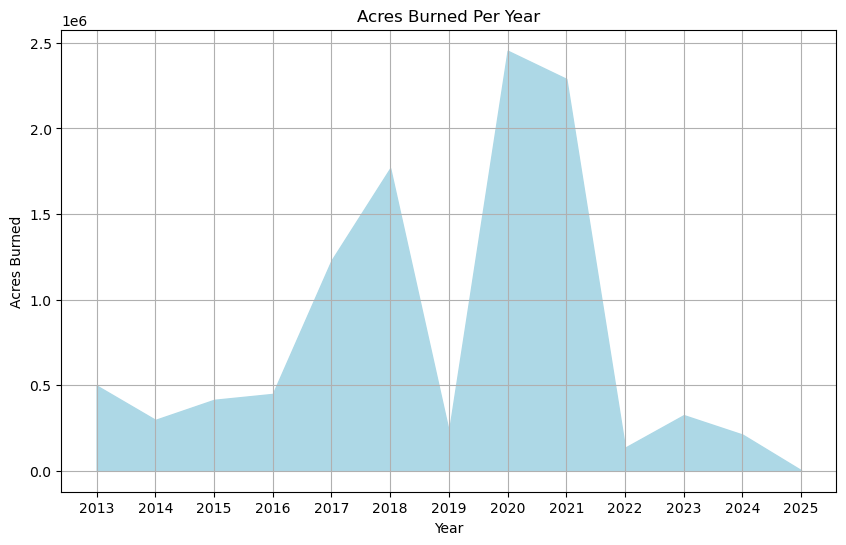

In [19]:
# Display using an Area Chart
plt.figure(figsize = (10,6))
plt.fill_between(final_data_tf["Year"], final_data_tf["Total"], color = "lightblue")
plt.title("Acres Burned Per Year")
plt.xlabel("Year")
plt.ylabel("Acres Burned")
plt.xticks(final_data_tf["Year"])
plt.grid()
plt.savefig("Output_Data/Acres Burned Per Year_tiya.png")
plt.show()

# Calculate and Display Counties Burned Per Year

In [21]:
# Finding all years combined data

counties_burned_tf = df_tf[["Fire Started year","County"]].copy()
counties_burned_tf.rename(columns = {"Fire Started year":"Year"},inplace = True)
counties_burned_new_tf = counties_burned_tf.groupby("Year")["County"].unique().reset_index()
counties_burned_new_tf["Number of Counties"] = counties_burned_new_tf["County"].apply(len) 
counties_burned_new_tf


,Year,County,Number of Counties
0,2013,"[Inyo, San Bernardino, Madera, Napa, Sonoma, T...",48
1,2014,"[Tehama, Humboldt, Los Angeles, Fresno, San Di...",31
2,2015,"[Siskiyou, Plumas, Riverside, Merced, Humboldt...",41
3,2016,"[Los Angeles, Merced, San Luis Obispo, Montere...",48
4,2017,"[Butte, Modoc, Shasta, Riverside, Fresno, Mont...",56
5,2018,"[Monterey, Inyo, Santa Barbara, Shasta, Rivers...",57
6,2019,"[Humboldt, Kings, Butte, Kern, Placer, San Die...",53
7,2020,"[Sierra, Tehama, Lassen, Glenn, Mendocino, Gle...",61
8,2021,"[Ventura, Kern, Riverside, Modoc, Santa Cruz, ...",52
9,2022,"[Inyo, Sonoma, Santa Barbara, Siskiyou, Shasta...",36


In [22]:
# Creating a copy from different year df

counties_in_different_years_tf = different_years_df_tf[["Fire Extinguished year","County"]].copy()
counties_in_different_years_tf.rename(columns = {"Fire Extinguished year" : "Year"},inplace = True)
counties_in_different_years_new_tf = counties_in_different_years_tf.groupby("Year")["County"].unique().reset_index()
counties_in_different_years_new_tf["Number of Counties"] = counties_in_different_years_new_tf["County"].apply(len)
counties_in_different_years_new_tf

,Year,County,Number of Counties
0,2017,[Santa Clara],1
1,2018,"[Butte, Modoc, Shasta, Riverside, Fresno, Mont...",56
2,2019,"[Monterey, Inyo, Santa Barbara, Shasta, Rivers...",57
3,2023,"[Riverside, San Bernardino, Alameda, Mariposa]",4


In [23]:
# Merging all data together

final_counties_data_tf = pd.merge(counties_burned_new_tf, counties_in_different_years_new_tf, on = "Year", how = "outer")

# Combining the strings from two columns, and handling NaN values
final_counties_data_tf["Counties Burned"] = final_counties_data_tf["County_x"].fillna("").astype(str) + (", " + final_counties_data_tf["County_x"].fillna("").astype(str))
final_counties_data_tf["Counties Burned"] = final_counties_data_tf["Counties Burned"].unique()
final_counties_data_tf["Total number"] = final_counties_data_tf["Number of Counties_x"].fillna(0) + final_counties_data_tf["Number of Counties_y"].fillna(0)
final_counties_data_tf

,Year,County_x,Number of Counties_x,County_y,Number of Counties_y,Counties Burned,Total number
0,2013,"[Inyo, San Bernardino, Madera, Napa, Sonoma, T...",48,NaN,NaN,['Inyo' 'San Bernardino' 'Madera' 'Napa' 'Sono...,48.0
1,2014,"[Tehama, Humboldt, Los Angeles, Fresno, San Di...",31,NaN,NaN,['Tehama' 'Humboldt' 'Los Angeles' 'Fresno' 'S...,31.0
2,2015,"[Siskiyou, Plumas, Riverside, Merced, Humboldt...",41,NaN,NaN,['Siskiyou' 'Plumas' 'Riverside' 'Merced' 'Hum...,41.0
3,2016,"[Los Angeles, Merced, San Luis Obispo, Montere...",48,NaN,NaN,['Los Angeles' 'Merced' 'San Luis Obispo' 'Mon...,48.0
4,2017,"[Butte, Modoc, Shasta, Riverside, Fresno, Mont...",56,[Santa Clara],1.0,['Butte' 'Modoc' 'Shasta' 'Riverside' 'Fresno'...,57.0
5,2018,"[Monterey, Inyo, Santa Barbara, Shasta, Rivers...",57,"[Butte, Modoc, Shasta, Riverside, Fresno, Mont...",56.0,['Monterey' 'Inyo' 'Santa Barbara' 'Shasta' 'R...,113.0
6,2019,"[Humboldt, Kings, Butte, Kern, Placer, San Die...",53,"[Monterey, Inyo, Santa Barbara, Shasta, Rivers...",57.0,['Humboldt' 'Kings' 'Butte' 'Kern' 'Placer' 'S...,110.0
7,2020,"[Sierra, Tehama, Lassen, Glenn, Mendocino, Gle...",61,NaN,NaN,"['Sierra' 'Tehama' 'Lassen' 'Glenn, Mendocino'...",61.0
8,2021,"[Ventura, Kern, Riverside, Modoc, Santa Cruz, ...",52,NaN,NaN,['Ventura' 'Kern' 'Riverside' 'Modoc' 'Santa C...,52.0
9,2022,"[Inyo, Sonoma, Santa Barbara, Siskiyou, Shasta...",36,NaN,NaN,['Inyo' 'Sonoma' 'Santa Barbara' 'Siskiyou' 'S...,36.0


In [24]:
# Displaying Total number of counties burned per year using a 2D scatter plot
fig = px.scatter(final_counties_data_tf, 
                 x = "Year", 
                 y = "Total number", 
                 title = "Total Counties Burned Per Year",
                 labels = {"Total number": "Counties Burned"},
                 color = "Total number",             # Color based on the total number of counties burned
                 color_continuous_scale = px.colors.sequential.Viridis
                )

# Update layout for better visualization
fig.update_traces(marker = dict(size = 15))

# Show the figure
fig.show()

# Calculate and Display Personnel Involved per Year

In [26]:
# Calculating total personnel involved per year using same years data

personnel_involved_same_year_tf = same_years_df_tf.groupby("Fire Started year")["Personnel Involved"].sum().reset_index()
personnel_involved_same_year_tf.columns = ["Year","Personnel Involved"]
personnel_involved_same_year_tf=personnel_involved_same_year_tf[personnel_involved_same_year_tf["Personnel Involved"] != 0]
personnel_involved_same_year_tf

,Year,Personnel Involved
0,2013,17170.0
1,2014,4249.0
2,2015,4509.0
3,2016,4231.0
4,2018,1521.0
5,2019,5657.0


In [27]:
# Creating a copy of Personnel Involved per day data from different year df

personnel_involved_different_year_tf = different_years_df_tf[["Personnel Involved","Fire Started year","Fire Extinguished year","days_of_wildfire","Active Days Until Year End"]].copy()

# Calculating personnel involved per day

personnel_involved_different_year_tf["Personnel Involved per day"] = personnel_involved_different_year_tf["Personnel Involved"] / personnel_involved_different_year_tf["days_of_wildfire"]

# Calculating Personnel Involved in the fire started year

personnel_involved_different_year_tf["Personnel Involved start year"] = personnel_involved_different_year_tf["Personnel Involved per day"] * personnel_involved_different_year_tf["Active Days Until Year End"]

# Calculating Personnel Involved in the fire ended year

personnel_involved_different_year_tf["Personnel Involved end year"] = personnel_involved_different_year_tf["Personnel Involved"] - personnel_involved_different_year_tf["Personnel Involved start year"]

# Creating new df with start year data

PI_start_year_tf = personnel_involved_different_year_tf.groupby("Fire Started year")["Personnel Involved start year"].sum().reset_index()
PI_start_year_tf.columns = ["Year","Personnel Involved (Start Year)"]
PI_start_year_tf["Personnel Involved (Start Year)"] = PI_start_year_tf["Personnel Involved (Start Year)"].astype(int)

# Creating new df with End year data
PI_end_year_tf = personnel_involved_different_year_tf.groupby("Fire Extinguished year")["Personnel Involved end year"].sum().reset_index()
PI_end_year_tf.columns = ["Year","Personnel Involved (End Year)"]
PI_end_year_tf["Personnel Involved (End Year)"] = PI_end_year_tf["Personnel Involved (End Year)"].astype(int)

# Merging start year and end year data together

merged_PI_data_tf = pd.merge(PI_start_year_tf, PI_end_year_tf, how = "outer")
merged_PI_data_tf

,Year,Personnel Involved (Start Year),Personnel Involved (End Year)
0,2016,16.0,NaN
1,2017,7475.0,45.0
2,2018,5486.0,992.0
3,2019,NaN,104.0
4,2022,0.0,NaN
5,2023,NaN,0.0


In [28]:
# Merging the different years data with same year data

final_PI_data_tf = pd.merge(personnel_involved_same_year_tf, merged_PI_data_tf, how = "outer")
final_PI_data_tf.fillna(0, inplace = True)

# Calculating Total Personnel Involved
final_PI_data_tf["Total"] = (final_PI_data_tf["Personnel Involved"] + final_PI_data_tf["Personnel Involved (Start Year)"] + final_PI_data_tf["Personnel Involved (End Year)"]).astype(int)
final_PI_data_tf = final_PI_data_tf[final_PI_data_tf["Total"] != 0]
final_PI_data_tf

,Year,Personnel Involved,Personnel Involved (Start Year),Personnel Involved (End Year),Total
0,2013,17170.0,0.0,0.0,17170
1,2014,4249.0,0.0,0.0,4249
2,2015,4509.0,0.0,0.0,4509
3,2016,4231.0,16.0,0.0,4247
4,2017,0.0,7475.0,45.0,7520
5,2018,1521.0,5486.0,992.0,7999
6,2019,5657.0,0.0,104.0,5761


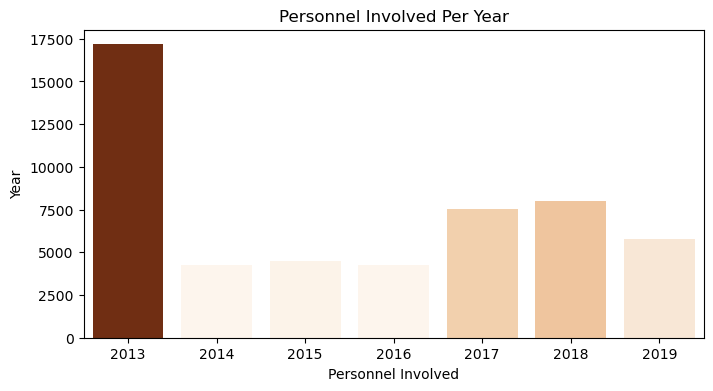

In [29]:
# Displaying Total Personnel Involved using bar

plt.figure(figsize = (8, 4))
sns.barplot(data = final_PI_data_tf, x = "Year", y = "Total", hue = "Total" , legend = False , palette = "Oranges")

plt.title("Personnel Involved Per Year")
plt.xlabel("Personnel Involved")
plt.ylabel("Year")
plt.savefig("Output_Data/Personnel Involved Per Year_tiya.png")
plt.show()

# Calculate and Display Structures damaged and destroyed per year


In [31]:
# Calculating total Structures Damaged per year from same year df

structures_damaged_per_year_tf = same_years_df_tf.groupby("Fire Started year")["Structures Damaged"].sum().reset_index()
structures_damaged_per_year_tf.columns = ["Year","Structures Damaged"]
structures_damaged_per_year_tf["Structures Damaged"] = structures_damaged_per_year_tf["Structures Damaged"].astype(int)
structures_damaged_per_year_tf = structures_damaged_per_year_tf[structures_damaged_per_year_tf["Structures Damaged"] != 0]

# Calculating total Structures Destroyed per year from same year df

structures_destroyed_per_year_tf = same_years_df_tf.groupby("Fire Started year")["Structures Destroyed"].sum().reset_index()
structures_destroyed_per_year_tf.columns = ["Year","Structures Destroyed"]
structures_destroyed_per_year_tf["Structures Destroyed"] = structures_destroyed_per_year_tf["Structures Destroyed"].astype(int)
structures_destroyed_per_year_tf = structures_destroyed_per_year_tf[structures_destroyed_per_year_tf["Structures Destroyed"] != 0]

# Merging same year data together

damage_destroyed_same_year_tf = pd.merge(structures_damaged_per_year_tf, structures_destroyed_per_year_tf, how = "outer")
damage_destroyed_same_year_tf

,Year,Structures Damaged,Structures Destroyed
0,2013,28,418
1,2014,10,534
2,2015,15,244
3,2016,45,741
4,2018,61,20418
5,2019,159,433


In [32]:
# Creating a copy of different years df

Structures_data_different_year_tf = different_years_df_tf[["Structures Damaged", "Structures Destroyed","Fire Started year","Fire Extinguished year","days_of_wildfire","Active Days Until Year End"]].copy()

# Calculating Structures Damaged and Destroyed per day
Structures_data_different_year_tf["Structures Damaged per day"] = Structures_data_different_year_tf["Structures Damaged"] / Structures_data_different_year_tf["days_of_wildfire"]
Structures_data_different_year_tf["Structures Destroyed per day"] = Structures_data_different_year_tf["Structures Destroyed"] / Structures_data_different_year_tf["days_of_wildfire"]

# Calculating Structures Damaged and Destroyed in the fire started year
Structures_data_different_year_tf["Structures Damaged start year"] = Structures_data_different_year_tf["Structures Damaged per day"] * Structures_data_different_year_tf["Active Days Until Year End"]
Structures_data_different_year_tf["Structures Destroyed start year"] = Structures_data_different_year_tf["Structures Destroyed per day"] * Structures_data_different_year_tf["Active Days Until Year End"]

# Calculating Structures Damaged and Destroyed in the fire ended year
Structures_data_different_year_tf["Structures Damaged end year"] = Structures_data_different_year_tf["Structures Damaged"] - Structures_data_different_year_tf["Structures Damaged start year"]
Structures_data_different_year_tf["Structures Destroyed end year"] = Structures_data_different_year_tf["Structures Destroyed"] - Structures_data_different_year_tf["Structures Destroyed start year"]

# Grouping together Fire Started Year Destruction data

destruction_start_year_tf = Structures_data_different_year_tf.groupby("Fire Started year")[["Structures Damaged start year","Structures Destroyed start year"]].sum().reset_index()
destruction_start_year_tf.columns = ["Year","Structures Damaged (Start Year)","Structures Destroyed (Start Year)"]

destruction_start_year_tf["Structures Damaged (Start Year)"] = destruction_start_year_tf["Structures Damaged (Start Year)"].astype(int)
destruction_start_year_tf["Structures Destroyed (Start Year)"] = destruction_start_year_tf["Structures Destroyed (Start Year)"].astype(int)

# Grouping together Fire Ended Year Destruction data

destruction_end_year_tf = Structures_data_different_year_tf.groupby("Fire Extinguished year")[["Structures Damaged end year","Structures Destroyed end year"]].sum().reset_index()
destruction_end_year_tf.columns = ["Year","Structures Damaged (End Year)","Structures Destroyed (End Year)"]

destruction_end_year_tf["Structures Damaged (End Year)"] = destruction_end_year_tf["Structures Damaged (End Year)"].astype(int)
destruction_end_year_tf["Structures Destroyed (End Year)"] = destruction_end_year_tf["Structures Destroyed (End Year)"].astype(int)
# Merging the different years start year and end year data together

combined_destruction_data_tf = pd.merge(destruction_start_year_tf, destruction_end_year_tf, how = "outer")
combined_destruction_data_tf.fillna(0, inplace = True)

# Calculating Total Structure Damaged and Destroyed
combined_destruction_data_tf["Total Damaged"] = (combined_destruction_data_tf["Structures Damaged (Start Year)"] + combined_destruction_data_tf["Structures Damaged (End Year)"]).astype(int)
combined_destruction_data_tf["Total Destroyed"] = (combined_destruction_data_tf["Structures Destroyed (Start Year)"] + combined_destruction_data_tf["Structures Destroyed (End Year)"]).astype(int)

combined_destruction_data_tf

,Year,Structures Damaged (Start Year),Structures Destroyed (Start Year),Structures Damaged (End Year),Structures Destroyed (End Year),Total Damaged,Total Destroyed
0,2016,0.0,7.0,0.0,0.0,0,7
1,2017,1271.0,6726.0,0.0,20.0,1271,6746
2,2018,346.0,2189.0,584.0,3060.0,930,5249
3,2019,0.0,0.0,18.0,99.0,18,99
4,2022,0.0,0.0,0.0,0.0,0,0
5,2023,0.0,0.0,0.0,0.0,0,0


In [33]:
# Merging the different years and same years data together

final_destruction_data_tf = pd.merge(damage_destroyed_same_year_tf, combined_destruction_data_tf, how = "outer")
final_destruction_data_tf.fillna(0, inplace = True)

# Calculating Total Structure Damaged and Destroyed
final_destruction_data_tf["Total Structures Damaged"] = (final_destruction_data_tf["Structures Damaged"] + final_destruction_data_tf["Total Damaged"]).astype(int)
final_destruction_data_tf["Total Structures Destroyed"] = (final_destruction_data_tf["Structures Destroyed"] + final_destruction_data_tf["Total Destroyed"]).astype(int)

final_destruction_data_tf = final_destruction_data_tf[final_destruction_data_tf["Total Structures Damaged"] != 0]
final_destruction_data_tf = final_destruction_data_tf[final_destruction_data_tf["Total Structures Destroyed"] != 0]

final_destruction_data_tf

,Year,Structures Damaged,Structures Destroyed,Structures Damaged (Start Year),Structures Destroyed (Start Year),Structures Damaged (End Year),Structures Destroyed (End Year),Total Damaged,Total Destroyed,Total Structures Damaged,Total Structures Destroyed
0,2013,28.0,418.0,0.0,0.0,0.0,0.0,0.0,0.0,28,418
1,2014,10.0,534.0,0.0,0.0,0.0,0.0,0.0,0.0,10,534
2,2015,15.0,244.0,0.0,0.0,0.0,0.0,0.0,0.0,15,244
3,2016,45.0,741.0,0.0,7.0,0.0,0.0,0.0,7.0,45,748
4,2017,0.0,0.0,1271.0,6726.0,0.0,20.0,1271.0,6746.0,1271,6746
5,2018,61.0,20418.0,346.0,2189.0,584.0,3060.0,930.0,5249.0,991,25667
6,2019,159.0,433.0,0.0,0.0,18.0,99.0,18.0,99.0,177,532


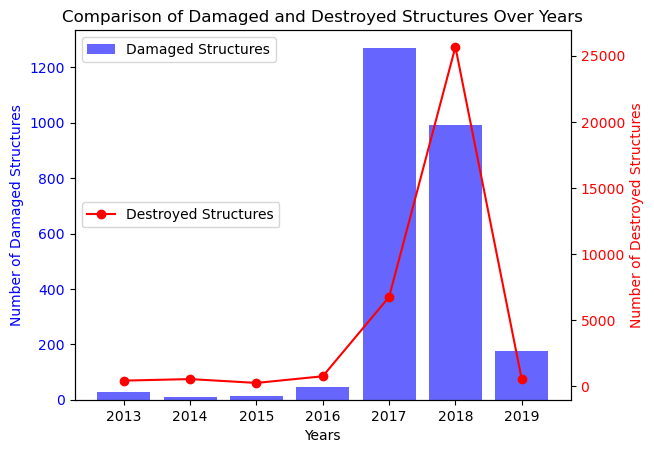

In [34]:
# Display the Total Structure Damaged and Destroyed per year using Twin Axis plotting

# Create a figure and a set of subplots
fig, ax1 = plt.subplots()

# Plotting the destroyed structures as a bar chart
ax1.bar(final_destruction_data_tf["Year"], final_destruction_data_tf["Total Structures Damaged"], color = "b", alpha = 0.6, label = "Damaged Structures")
ax1.set_xlabel("Years")
ax1.set_ylabel("Number of Damaged Structures", color="b")
ax1.tick_params(axis = "y", labelcolor = "b")

# Create a second y-axis for the damaged structures
ax2 = ax1.twinx()
ax2.plot(final_destruction_data_tf["Year"], final_destruction_data_tf["Total Structures Destroyed"], color = "r", marker = "o", label = "Destroyed Structures")
ax2.set_ylabel("Number of Destroyed Structures", color = "r")
ax2.tick_params(axis = "y", labelcolor = "r")

# Adding title and legends
plt.title("Comparison of Damaged and Destroyed Structures Over Years")
ax1.legend(loc = "upper left")
ax2.legend(loc = "center left")

plt.savefig("Output_Data/Comparison of Damaged and Destroyed Structures Over Years_tiya.png")

# Show the plot
plt.show()

# Calculate and Display average length(duration) of the wildfires per year

In [36]:
# Calculating total active days of wildfire from the same year data

wildfire_days_same_years_tf = same_years_df_tf[["Fire Started", "Fire Extinguished","Fire Started year"]].copy()
wildfire_days_same_years_tf["days_of_wildfire"] = (wildfire_days_same_years_tf["Fire Extinguished"] - wildfire_days_same_years_tf["Fire Started"]).dt.days
wildfire_days_same_years_tf = wildfire_days_same_years_tf[wildfire_days_same_years_tf["days_of_wildfire"] >= 0]
wildfire_days_same_years_tf

# Calculating Count, Sum of Values and Average

wildfire_days_same_years_tf = wildfire_days_same_years_tf.groupby("Fire Started year").agg(
                                 Count = ("days_of_wildfire", "count"),
                                 Sum_Values = ("days_of_wildfire", "sum"),
                                 Average = ("days_of_wildfire", "mean")
 )
wildfire_days_same_years_tf["Average"] = wildfire_days_same_years_tf["Average"].astype(int)
wildfire_days_same_years_tf.rename_axis("Year", inplace = True)          # renaming index column

wildfire_days_same_years_tf


,Count,Sum_Values,Average
Year,,,
2013,137,419,3
2014,74,790,10
2015,98,580,5
2016,152,967,6
2018,2,54,27
2019,189,912,4
2020,192,1367,7
2021,153,1470,9
2022,79,350,4


In [37]:
# Creating a copy of different year dataframe

wildfire_days_different_year_tf = different_years_df_tf[["Fire Started year","Fire Extinguished year","days_of_wildfire","Active Days Until Year End","Remaining Days from the begining"]].copy()


# Creating new dataframe with start year Count,Sum of Values and Average

wildfire_days_start_year_tf = wildfire_days_different_year_tf.groupby("Fire Started year").agg(
                                 Count = ("Active Days Until Year End", "count"),
                                 Sum_Values = ("Active Days Until Year End", "sum"),
                                 Average = ("Active Days Until Year End", "mean")
                                  ).astype(int)


wildfire_days_start_year_tf.rename_axis("Year", inplace = True)    # renaming index column


# Creating new dataframe with end year Count,Sum of Values and Average

wildfire_days_end_year_tf = wildfire_days_different_year_tf.groupby("Fire Extinguished year").agg(
                                   Count = ("Remaining Days from the begining", "count"),
                                    Sum_Values = ("Remaining Days from the begining", "sum"),
                                    Average = ("Remaining Days from the begining", "mean")
                                    ).astype(int)

wildfire_days_end_year_tf.rename_axis("Year", inplace = True)     # renaming index column


# Merging different years start and end data together

combined_wildfire_days_tf = pd.merge(wildfire_days_start_year_tf, wildfire_days_end_year_tf, on = "Year", how = "outer")
combined_wildfire_days_tf.fillna(0, inplace = True)
combined_wildfire_days_tf = combined_wildfire_days_tf.astype(int)

combined_wildfire_days_tf["Count"] = combined_wildfire_days_tf["Count_x"] + combined_wildfire_days_tf["Count_y"]
combined_wildfire_days_tf["Sum_Values"] = combined_wildfire_days_tf["Sum_Values_x"] + combined_wildfire_days_tf["Sum_Values_y"]
combined_wildfire_days_tf["Average"] = (combined_wildfire_days_tf["Sum_Values"]/combined_wildfire_days_tf["Count"]).astype(int)

combined_wildfire_days_tf


,Count_x,Sum_Values_x,Average_x,Count_y,Sum_Values_y,Average_y,Count,Sum_Values,Average
Year,,,,,,,,,
2016,1,96,96,0,0,0,1,96,96
2017,429,65144,151,1,261,261,430,65405,152
2018,301,50066,166,429,5183,12,730,55249,75
2019,0,0,0,301,1078,3,301,1078,3
2022,4,789,197,0,0,0,4,789,197
2023,0,0,0,4,714,178,4,714,178


In [38]:
# Merging together same year and different year data

wildfire_days_same_years_tf_reset = wildfire_days_same_years_tf.reset_index()
combined_wildfire_days_tf_reset = combined_wildfire_days_tf.reset_index()

wildfire_days_tf = pd.merge(wildfire_days_same_years_tf_reset[["Year", "Count", "Sum_Values", "Average"]], combined_wildfire_days_tf_reset[["Year", "Count", "Sum_Values", "Average"]], on = "Year", how = "outer")
wildfire_days_tf.fillna(0, inplace = True)
wildfire_days_tf = wildfire_days_tf.astype(int)

wildfire_days_tf["Count"] = wildfire_days_tf["Count_x"] + wildfire_days_tf["Count_y"]
wildfire_days_tf["Sum_Values"] = wildfire_days_tf["Sum_Values_x"] + wildfire_days_tf["Sum_Values_y"]
wildfire_days_tf["Average"] = (wildfire_days_tf["Sum_Values"]/wildfire_days_tf["Count"]).astype(int)

wildfire_days_tf

,Year,Count_x,Sum_Values_x,Average_x,Count_y,Sum_Values_y,Average_y,Count,Sum_Values,Average
0,2013,137,419,3,0,0,0,137,419,3
1,2014,74,790,10,0,0,0,74,790,10
2,2015,98,580,5,0,0,0,98,580,5
3,2016,152,967,6,1,96,96,153,1063,6
4,2017,0,0,0,430,65405,152,430,65405,152
5,2018,2,54,27,730,55249,75,732,55303,75
6,2019,189,912,4,301,1078,3,490,1990,4
7,2020,192,1367,7,0,0,0,192,1367,7
8,2021,153,1470,9,0,0,0,153,1470,9
9,2022,79,350,4,4,789,197,83,1139,13


In [39]:
# Create a bar chart for the number of wildfires
fig = go.Figure()

fig.add_trace(go.Bar(
    x = wildfire_days_tf["Year"],
    y = wildfire_days_tf["Count"],
    name = "Total Wildfire Days",
    marker_color = "Orange"
))

# Line plot for average days

fig.add_trace(go.Scatter(
    x = wildfire_days_tf["Year"],
    y = wildfire_days_tf["Average"],
    name = "Average Days per Wildfire",
    mode = "lines+markers",
    marker_color = "brown"
))

# Update layout

fig.update_layout(
    title = "California Wildfires (2013-2025)",
    xaxis_title = "Year",
    yaxis_title = "Days",
    legend_title = "Legend",
    template = "plotly_white"
)

fig.show()

# Does the Temperature, Humidity and Time of year have a correlation with the number of acres burned?

In [41]:
#Import dataset
weather_data = pd.read_csv("./Data source/weather_daily.csv")
cali_fires = df.copy()

In [42]:
weather_data.isna().mean()*100 #checking to see for NaN Values

location_id           0.0
time                  0.0
Temp (C)              0.0
average humidity %    0.0
average wind speed    0.0
dtype: float64

In [43]:
#Changing location IDS to cities
weather_data["location_id"] = weather_data["location_id"].replace({0: "Sacramento", 1: "Fresno", 2: "LA"}) 
type(cali_fires["Fire Started"][1])

str

In [44]:
#Need to convert dt string to dtg to match my temperature data
cali_fires["Fire Started"] = pd.to_datetime(cali_fires["Fire Started"])

# times in a dtg is a burnden for me. I can now work with both data sets
cali_fires["Fire Started"] = cali_fires["Fire Started"].dt.date

type(weather_data["time"][1]) # Also a string. Will have to change this too.

str

In [45]:
weather_data["time"] = pd.to_datetime(weather_data["time"]) #dt.date only works with dtg
weather_data["time"] = weather_data["time"].dt.date 
type(weather_data["time"][1]) #same format. Perfect!

datetime.date

In [46]:
weather_by_city = weather_data.groupby(["location_id","time"]).mean() # this gives us data grouped by city
#then groups to make an average by day by city. Unsure if this will be helpful, but it's worth having

avg_daily =weather_data.drop(["location_id"],axis = 1, inplace = True)# dropping location ID. Will not average well.
avg_daily = weather_data.groupby(["time"]).mean()
avg_daily.reset_index()
# The 3 cities were picked to be a representative sample of california weather, taken from 3 major cities, one from the north, middle and south
# of the state. All conditions are averaged to take an approximate "state average."  

,time,Temp (C),average humidity %,average wind speed
0,2013-01-01,-4.941667,63.611111,27.830556
1,2013-01-02,-6.508333,50.444444,23.434722
2,2013-01-03,-5.663889,52.805556,14.170833
3,2013-01-04,-4.451389,51.125000,15.762500
4,2013-01-05,-3.670833,53.402778,11.315278
...,...,...,...,...
2917,2020-12-27,2.694444,82.041667,15.708333
2918,2020-12-28,0.240278,80.888889,40.044444
2919,2020-12-29,-6.926389,54.694444,41.340278
2920,2020-12-30,-5.663889,44.652778,29.204167


In [47]:
cali_fires.rename(columns = {"Fire Started":"time"}, inplace = True) # giving myself something to merge onto
cali_fires.head()

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Personnel Involved,Structures Damaged,Structures Destroyed,Structures Threatened,Water Tenders,time,Fire Extinguished,Longitude,Latitude,Incident ID
0,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,476.0,0.0,0.0,0.0,25.0,2013-02-24,2013-02-28T20:00:00Z,-118.016510,36.602575,094719ba-a47b-4abb-9ec5-a506b2b9fd23
1,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-20,2013-04-22T09:00:00Z,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f
2,2,Gold Fire,Madera,CAL FIRE Madera-Mariposa-Merced Unit,274.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-30,2013-05-01T07:00:00Z,-119.635004,37.116295,357ffc13-bef9-48eb-810f-c5de851972eb
3,3,Silverado Fire,Napa,CAL FIRE Sonoma-Lake-Napa Unit,75.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-30,2013-05-01T17:15:00Z,-122.350844,38.441792,d8d1c943-7b5d-4885-9043-f41075d6eded
4,4,Yellow Fire,Sonoma,CAL FIRE Sonoma-Lake-Napa Unit,125.0,9.0,5.0,17.0,0.0,5.0,...,249.0,0.0,0.0,0.0,5.0,2013-05-01,2013-05-03T06:15:00Z,-122.655616,38.638828,64e4f81e-d872-44c4-ba8d-111fa77124ba


In [48]:
weather_fire_days = pd.merge(avg_daily,cali_fires, how = "inner", on = ["time"])
weather_fire_days.rename(columns = {"time":"Fire Started"}, inplace = True) #switching back the name after merge
weather_fire_days["Acres Burned"][1]

30.0

In [49]:
weather_fire_days.head()

,Fire Started,Temp (C),average humidity %,average wind speed,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,...,Injuries,Personnel Involved,Structures Damaged,Structures Destroyed,Structures Threatened,Water Tenders,Fire Extinguished,Longitude,Latitude,Incident ID
0,2013-02-24,5.305556,81.930556,23.537500,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,...,2.0,476.0,0.0,0.0,0.0,25.0,2013-02-28T20:00:00Z,-118.016510,36.602575,094719ba-a47b-4abb-9ec5-a506b2b9fd23
1,2013-04-20,6.848611,67.430556,20.662500,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2013-04-22T09:00:00Z,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f
2,2013-04-30,13.861111,58.111111,24.479167,2,Gold Fire,Madera,CAL FIRE Madera-Mariposa-Merced Unit,274.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2013-05-01T07:00:00Z,-119.635004,37.116295,357ffc13-bef9-48eb-810f-c5de851972eb
3,2013-04-30,13.861111,58.111111,24.479167,3,Silverado Fire,Napa,CAL FIRE Sonoma-Lake-Napa Unit,75.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2013-05-01T17:15:00Z,-122.350844,38.441792,d8d1c943-7b5d-4885-9043-f41075d6eded
4,2013-05-01,13.643056,62.125000,18.434722,4,Yellow Fire,Sonoma,CAL FIRE Sonoma-Lake-Napa Unit,125.0,9.0,...,0.0,249.0,0.0,0.0,0.0,5.0,2013-05-03T06:15:00Z,-122.655616,38.638828,64e4f81e-d872-44c4-ba8d-111fa77124ba


# IMPORTANT NOTE

In [51]:
print(f"Mean of Acres burned {weather_fire_days["Acres Burned"].mean()}, median of acres burned {weather_fire_days["Acres Burned"].median()}")

Mean of Acres burned 4627.586892919836, median of acres burned 102.0


The data has a massive RIGHT skew because of a handful of huge values, offset by an abundance of tiny values. I propose we focuse on large wild fires-- 100 acres or more. 

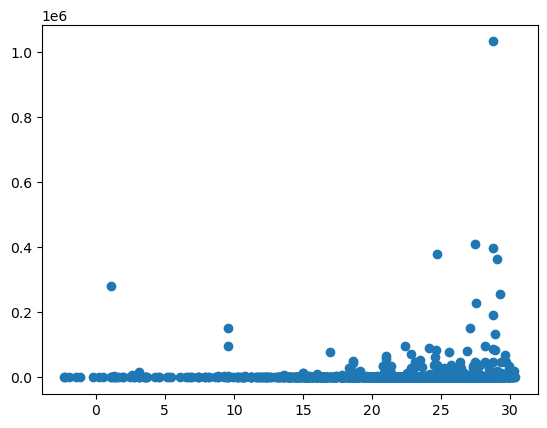

In [53]:
# Let's start with a simple graph-- a scatter plot between average temperature and acres burned
x_scatter = weather_fire_days["Temp (C)"]
y_scatter = weather_fire_days["Acres Burned"]
plt.scatter(x_scatter, y_scatter)
#This graph is listed in millions, and very clustered at the bottom. 
#I imagine because there are countless tiny fires. Possibly ask about dropping fires burning under 10 acres?

(0.0, 1100000.0)

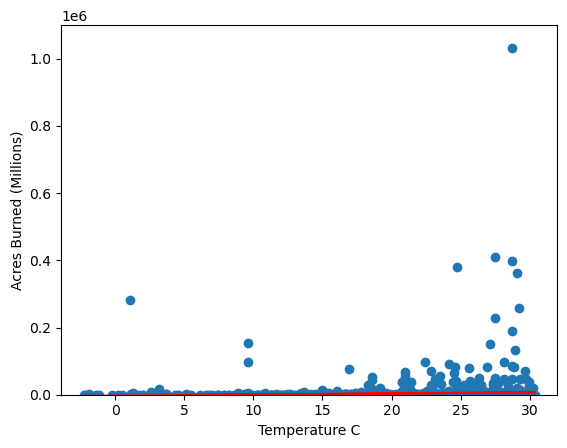

In [54]:
x_scatter = weather_fire_days["Temp (C)"]
y_scatter = weather_fire_days["Acres Burned"]
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_scatter, y_scatter) #Takes lin reg of data. r value = correl coeff.
regress_values = x_scatter * slope + intercept

plt.plot(x_scatter, regress_values, "r-", label=f"y={slope:.2f}x+{intercept:.2f}")

plt.scatter(x_scatter, y_scatter)
plt.xlabel("Temperature C")
plt.ylabel("Acres Burned (Millions)")
plt.ylim(0,1100000)

# that single fire so high is the "August complex" fire.
# I know why this is not showing much correllation... All datapoints show a fire; rather than some datapoints showing a lack
#of fire on that date. If most fires are contained before going to class D throughout the year,then there will be little correl 

In [55]:
weather_fire_days["average humidity %"].min()

41.02777778

In [56]:
bins = [-5, 0, 5,10,15, 20 ,25 ,30]
labels = ["-5-0", "0-5","5-10","10-15","15,20","20-25","+25",]
temp_binned = weather_fire_days.copy()
temp_binned["Temp (C)"] = (pd.cut(temp_binned["Temp (C)"], bins = bins, labels = labels))
temp_binned = temp_binned[["Temp (C)", "Acres Burned"]]# dropping most columns. Will not sum well.
temp_bin_count = temp_binned.groupby(["Temp (C)"],observed=True).count()
temp_binned = temp_binned.groupby(["Temp (C)"],observed=True).sum()
temp_binned = temp_binned.reset_index()

temp_binned

,Temp (C),Acres Burned
0,-5-0,2082.0
1,0-5,326998.0
2,5-10,268268.0
3,10-15,60018.0
4,"15,20",377653.0
5,20-25,1880830.0
6,+25,4969777.0


In [57]:
temp_bin_count

,Acres Burned
Temp (C),
-5-0,6
0-5,31
5-10,29
10-15,84
"15,20",233
20-25,699
+25,619


(0.0, 10000000.0)

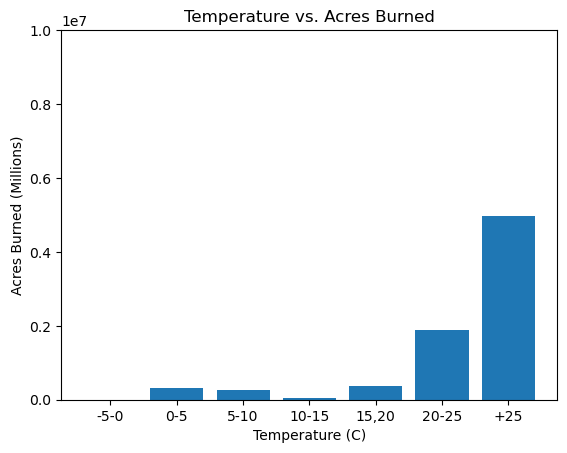

In [58]:
x_bar = temp_binned["Temp (C)"]
y_bar = temp_binned["Acres Burned"]
plt.bar(x_bar, y_bar)
plt.xlabel("Temperature (C)")
plt.ylabel("Acres Burned (Millions)")
plt.title("Temperature vs. Acres Burned")
plt.savefig("Output_Data/Temperature vs Acres Burened 2013-2020.png")
# plt.savefig("Temperature vs Acres Burened 2013-2020.png")
plt.ylim(0,10000000)

In [59]:
#humidity 
h_bins = [40, 50, 60 ,70 ,80, 90 ,100 ]
h_labels = ["40-50", "50-60","60-70","70-80","80-90","90+"]
h_binned = weather_fire_days.copy()
h_binned["average humidity %"] = (pd.cut(h_binned["average humidity %"], bins = h_bins, labels = h_labels))
h_binned = h_binned[["average humidity %", "Acres Burned"]]
h_bin_count = h_binned.groupby(["average humidity %"],observed=True).count()
h_binned = h_binned.groupby(["average humidity %"],observed=True).sum()
h_binned = h_binned.reset_index()
h_binned

,average humidity %,Acres Burned
0,40-50,287092.0
1,50-60,123556.0
2,60-70,225674.0
3,70-80,2717258.0
4,80-90,3956911.0
5,90+,598055.0


In [60]:
h_bin_count

,Acres Burned
average humidity %,
40-50,17
50-60,166
60-70,283
70-80,602
80-90,609
90+,32


(0.0, 10000000.0)

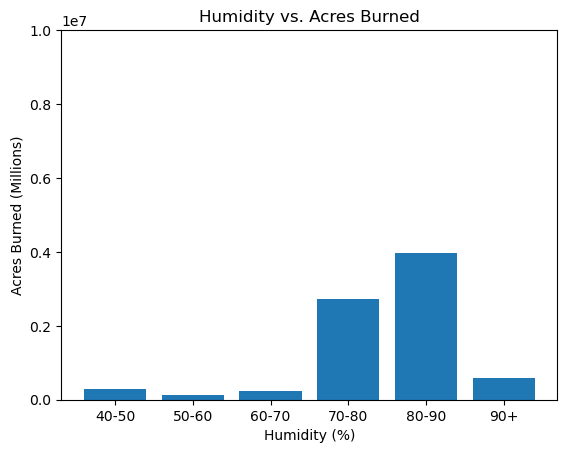

In [61]:
x_bar = h_binned["average humidity %"]
y_bar = h_binned["Acres Burned"]
plt.bar(x_bar, y_bar)
plt.xlabel("Humidity (%)")
plt.ylabel("Acres Burned (Millions)")
plt.title("Humidity vs. Acres Burned")
plt.savefig("Output_Data/Humidity vs Acres Burened 2013-2020.png")
# plt.savefig("Humidity vs Acres Burned 2013-2020.png")
plt.ylim(0,10000000)

In [62]:
weather_fire_days["Acres Burned"].max()

1032648.0

In [63]:
by_month = weather_fire_days.copy()

by_month["Fire Started"] = pd.to_datetime(by_month["Fire Started"])

by_month["Fire Started"] = by_month["Fire Started"].dt.month 

by_month_sum = by_month[["Fire Started" , "Acres Burned"]]

by_month_sum = by_month_sum.groupby(["Fire Started"]).sum()

by_month_sum = by_month_sum.reset_index()
by_month_sum

,Fire Started,Acres Burned
0,1,3286.0
1,2,3187.0
2,3,1205.0
3,4,13227.0
4,5,109062.0
5,6,340889.0
6,7,2294718.0
7,8,3127047.0
8,9,1019214.0
9,10,403198.0


In [64]:
by_month_sum["Fire Started"] = by_month_sum["Fire Started"].replace({1: "Jan", 2: "Feb", 3: "Mar", 4:"Apr" , 5:"May" , 6:"Jun" ,7:"Jul" , 8: "Aug",9: "Sep", 10:"Oct" , 11:"Nov", 12:"Dec"})

<function matplotlib.pyplot.show(close=None, block=None)>

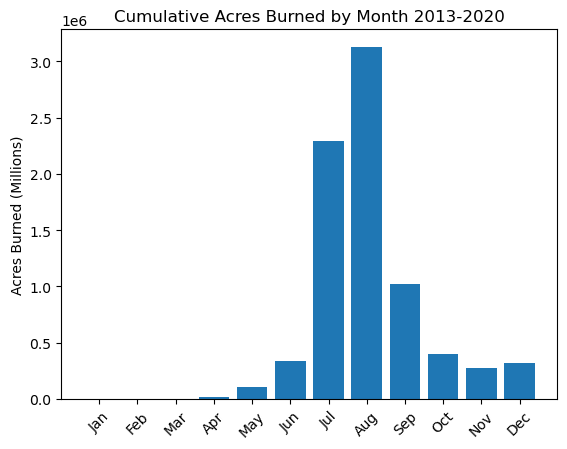

In [65]:
acres_burnt = by_month_sum["Acres Burned"]

plt.bar(x= by_month_sum["Fire Started"],height= acres_burnt)
plt.xticks(rotation=45)
plt.ylabel("Acres Burned (Millions)")
plt.title("Cumulative Acres Burned by Month 2013-2020")
plt.savefig("Output_Data/Acres Burned by Month.png")
plt.show

In [66]:
by_month_avg = by_month[["Fire Started","Temp (C)","average humidity %", "average wind speed"]]# can't put Acres burned here; it averages fire size, rather than fires burned in december.
#to get average acres burned, we can divide by month sum by 8 years of data to get average burned per month
by_month_avg =  by_month_avg.groupby(["Fire Started"]).mean()
by_month_avg = by_month_avg.reset_index()
by_month_avg["Fire Started"] = by_month_avg["Fire Started"].replace({1: "Jan", 2: "Feb", 3: "Mar", 4:"Apr" , 5:"May" , 6:"Jun" ,7:"Jul" , 8: "Aug",9: "Sep", 10:"Oct" , 11:"Nov", 12:"Dec"})
by_month_avg

,Fire Started,Temp (C),average humidity %,average wind speed
0,Jan,1.355556,64.788889,17.285833
1,Feb,3.436250,70.873611,24.518889
2,Mar,9.209896,70.201389,26.035243
3,Apr,14.462024,61.575794,24.293056
4,May,19.038784,66.257728,24.141082
5,Jun,22.964775,73.374071,20.130664
6,Jul,26.399958,82.469484,18.964023
7,Aug,26.715147,80.408885,18.588170
8,Sep,22.829654,71.369339,17.659571
9,Oct,16.333885,69.025386,19.531328


<function matplotlib.pyplot.show(close=None, block=None)>

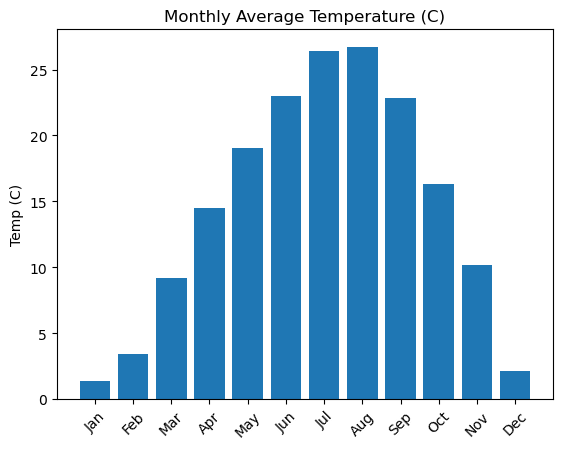

In [67]:
plt.bar(x= by_month_avg["Fire Started"],height= by_month_avg["Temp (C)"])
plt.xticks(rotation=45)
plt.ylabel("Temp (C)")
plt.title("Monthly Average Temperature (C)")
plt.savefig("Output_Data/Monthly Average Temperature (C).png")
plt.show

In [68]:
by_year = weather_fire_days.copy()
by_year["Fire Started"] = pd.to_datetime(by_year["Fire Started"])
by_year["Fire Started"] = by_year["Fire Started"].dt.year 
by_year_sum = by_year[["Fire Started" , "Acres Burned"]]
by_year_sum = by_year_sum.groupby(["Fire Started"]).sum()
by_year_sum = by_year_sum.reset_index()
by_year_sum

,Fire Started,Acres Burned
0,2013,497485.0
1,2014,296982.0
2,2015,414202.0
3,2016,452101.0
4,2017,1449419.0
5,2018,1569513.0
6,2019,286810.0
7,2020,2942034.0


<function matplotlib.pyplot.show(close=None, block=None)>

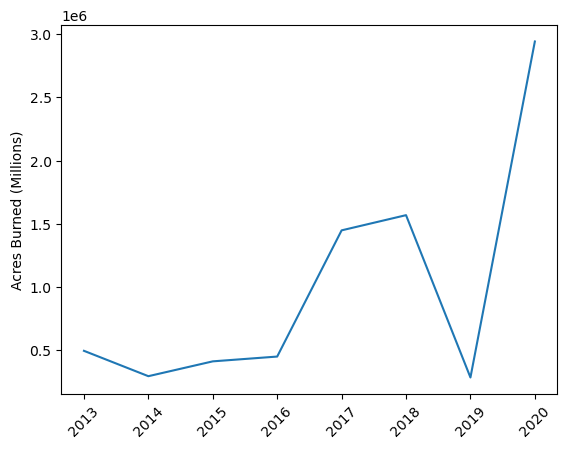

In [69]:
yearly_acres_burnt = by_year_sum["Acres Burned"]

plt.plot(by_year_sum["Fire Started"],yearly_acres_burnt)
plt.xticks(rotation=45)
plt.ylabel("Acres Burned (Millions)")
plt.show

In [70]:
#adding 8 year average burning by month
temp =  by_month_sum.copy()
temp["Acres Burned"] = temp["Acres Burned"]/8
temp
by_month_avg = pd.merge(by_month_avg, temp, on = ["Fire Started"], how = "inner")
by_month_avg

,Fire Started,Temp (C),average humidity %,average wind speed,Acres Burned
0,Jan,1.355556,64.788889,17.285833,410.750
1,Feb,3.436250,70.873611,24.518889,398.375
2,Mar,9.209896,70.201389,26.035243,150.625
3,Apr,14.462024,61.575794,24.293056,1653.375
4,May,19.038784,66.257728,24.141082,13632.750
5,Jun,22.964775,73.374071,20.130664,42611.125
6,Jul,26.399958,82.469484,18.964023,286839.750
7,Aug,26.715147,80.408885,18.588170,390880.875
8,Sep,22.829654,71.369339,17.659571,127401.750
9,Oct,16.333885,69.025386,19.531328,50399.750


 # What is the abnormal constraint for regrowth for California Wildfires?
 
 - According to the graphs shown containment of California fires leaves a summary of environmental impacts, such as the severity of the fire, the time it took for containment and the vegetation of the land how compromised was the soil. 
- We will go over the time frames of the top five fires that are graphed. What top three soil implementaion is involved to create better soil to promote the growth of a sustainable forest. Water bars are needed for soil erosion to stop depleting of the soil base. Re seeding the soil and trees as well as shrubs to ensure growth of the lost seedinglings, trees and shrubs. Creating check dams to water the burned soild helps with removal of the burnt soild that has no life to regenerate growth.
- **Findings are Null due to the fact time frames differ for mutiple reasoning factors that depict location, wheather factors, climate change, erosoin, the ecosystem complexity, species richness, and polarization.**

In [72]:
city_data_df = df.copy()
city_data_df.head()

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Personnel Involved,Structures Damaged,Structures Destroyed,Structures Threatened,Water Tenders,Fire Started,Fire Extinguished,Longitude,Latitude,Incident ID
0,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,476.0,0.0,0.0,0.0,25.0,2013-02-24T08:16:00Z,2013-02-28T20:00:00Z,-118.016510,36.602575,094719ba-a47b-4abb-9ec5-a506b2b9fd23
1,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-20T17:30:00Z,2013-04-22T09:00:00Z,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f
2,2,Gold Fire,Madera,CAL FIRE Madera-Mariposa-Merced Unit,274.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-30T12:59:00Z,2013-05-01T07:00:00Z,-119.635004,37.116295,357ffc13-bef9-48eb-810f-c5de851972eb
3,3,Silverado Fire,Napa,CAL FIRE Sonoma-Lake-Napa Unit,75.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-30T23:44:00Z,2013-05-01T17:15:00Z,-122.350844,38.441792,d8d1c943-7b5d-4885-9043-f41075d6eded
4,4,Yellow Fire,Sonoma,CAL FIRE Sonoma-Lake-Napa Unit,125.0,9.0,5.0,17.0,0.0,5.0,...,249.0,0.0,0.0,0.0,5.0,2013-05-01T02:01:00Z,2013-05-03T06:15:00Z,-122.655616,38.638828,64e4f81e-d872-44c4-ba8d-111fa77124ba


In [73]:
# Show California wildfires calculation on how long it last and containment extinguished dates


date_string = "2013-02-24T08:16:00Z"
date_format = "%Y-%m-%dT%H:%M:%SZ"
durations = []
days = []
for i, row in city_data_df.iterrows():
    try:
        start_dt = datetime.timestamp(datetime.strptime(row["Fire Started"], date_format)) 
        end_dt = datetime.timestamp(datetime.strptime(row["Fire Extinguished"], date_format))
    except:
        start_dt =   0
        end_dt =   0
    duration = end_dt - start_dt
    no_days = int( duration / 86400)
    if no_days <= 0:
        no_days = 1
    durations.append(duration)
    days.append(no_days)
    #print( f"Start Date {start_dt}, End date {end_dt}, duration {duration}")
#print( durations)
city_data_df["Duration"] = durations
city_data_df["Days"] = days
#city_data_df["Duration"].max()
city_data_df.head()

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Structures Destroyed,Structures Threatened,Water Tenders,Fire Started,Fire Extinguished,Longitude,Latitude,Incident ID,Duration,Days
0,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,0.0,0.0,25.0,2013-02-24T08:16:00Z,2013-02-28T20:00:00Z,-118.016510,36.602575,094719ba-a47b-4abb-9ec5-a506b2b9fd23,387840.0,4
1,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2013-04-20T17:30:00Z,2013-04-22T09:00:00Z,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f,142200.0,1
2,2,Gold Fire,Madera,CAL FIRE Madera-Mariposa-Merced Unit,274.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2013-04-30T12:59:00Z,2013-05-01T07:00:00Z,-119.635004,37.116295,357ffc13-bef9-48eb-810f-c5de851972eb,64860.0,1
3,3,Silverado Fire,Napa,CAL FIRE Sonoma-Lake-Napa Unit,75.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2013-04-30T23:44:00Z,2013-05-01T17:15:00Z,-122.350844,38.441792,d8d1c943-7b5d-4885-9043-f41075d6eded,63060.0,1
4,4,Yellow Fire,Sonoma,CAL FIRE Sonoma-Lake-Napa Unit,125.0,9.0,5.0,17.0,0.0,5.0,...,0.0,0.0,5.0,2013-05-01T02:01:00Z,2013-05-03T06:15:00Z,-122.655616,38.638828,64e4f81e-d872-44c4-ba8d-111fa77124ba,188040.0,2


In [74]:
fig = px.scatter_geo(city_data_df, 
                     lat='Latitude', 
                     lon='Longitude', 
                     size='Days',  # Size of the points based on the 'value' column
                     projection='natural earth') # Choose map projection

fig.update_layout(
    geo = dict(
        scope = 'north america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        projection = dict(
            type = 'conic conformal',
            rotation_lon = -100
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -125.0, -114.0],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 32.0, 42.0 ],
            dtick = 5
        )
    ),
    width= 1000,
    height = 600,
    title_text='Scatter Plot of Wildfire Duration on a California Map'
)
fig.show()

In [75]:
max_days = city_data_df["Days"].max()
mean_days = int(city_data_df["Days"].mean())
sum_days = city_data_df["Days"].sum()

print(f"Max Days {max_days}, Average Days {mean_days}, Total Days {sum_days}")

Max Days 391, Average Days 47, Total Days 132822


# Time series plots of California wildfires

In [77]:
df_FG=df.copy()

In [78]:
df_FG["Fire Started"] = pd.to_datetime(df_FG["Fire Started"], errors='coerce')
df_FG = df_FG[df_FG['Acres Burned'] != 0]
df_FG = df_FG[['Fire Started','Acres Burned']]
df_FG['year_month']= df_FG['Fire Started'].dt.to_period('M')

C:\Users\dagim\AppData\Local\Temp\ipykernel_15992\1869438286.py:4: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



In [79]:
#Group data by months and count fire occurrences
fire_counts = df_FG.groupby('year_month').size()
fire_counts= pd.DataFrame(fire_counts)
fire_counts.columns=['Counts']
fire_counts.index = fire_counts.index.to_timestamp()

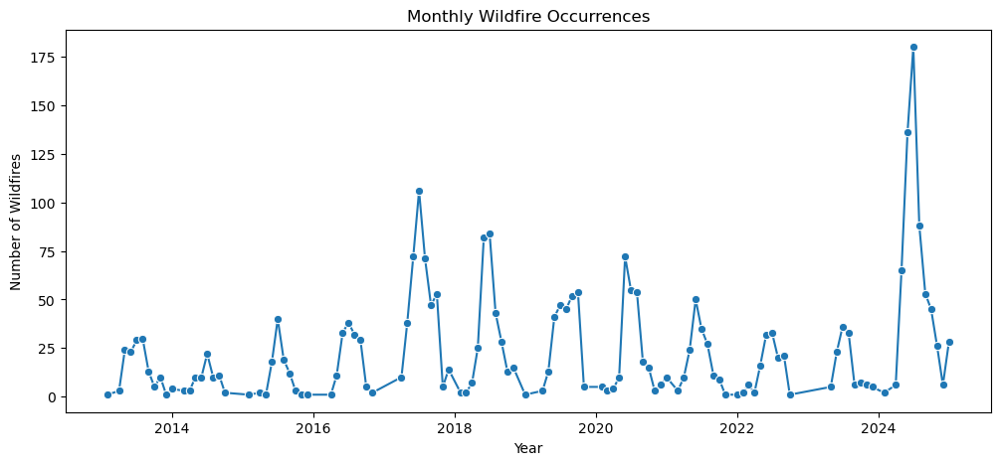

In [80]:
plt.figure(figsize=(12, 5))
sns.lineplot(x=fire_counts.index, y=fire_counts['Counts'], marker="o")
plt.title("Monthly Wildfire Occurrences")
plt.xlabel("Year")
plt.ylabel("Number of Wildfires")
plt.savefig('Output_Data/Monthly Wildfire Occurrences_FG')
plt.show()

# Correlation Between Injuries and Acres Burned

In [82]:
df_FG=df.copy()
df_FG['Acres Burned Log'] = np.log1p(df_FG['Acres Burned'])

In [83]:
def linear_regression_plot(x,y):

    slope, intercept, r, p, std_err = linregress(x,y)

    y_axis = list(map((lambda x_valus: slope * x_valus + intercept), x))
 
    plt.plot(x, y_axis, color= 'blue')
 
    equation = f"y={slope:.2f}x + {intercept:.2f}"

    plt.text(min(x),min(y), equation, fontsize= 15, color='blue', verticalalignment='top')
 
    print(f'The r^2 value is: {np.square(r)}')

The r^2 value is: 0.14022282587532023


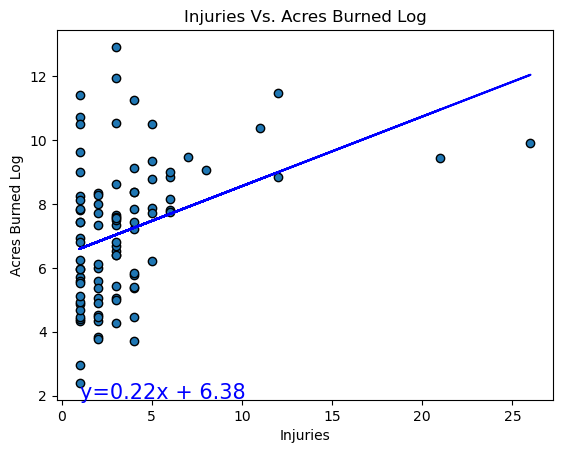

In [84]:
injuries = df_FG[df_FG['Injuries'] != 0]
x=injuries['Injuries']

y=injuries['Acres Burned Log'] 
 
linear_regression_plot(x,y) 
plt.xlabel('Injuries')
plt.ylabel('Acres Burned Log')
plt.title('Injuries Vs. Acres Burned Log')
plt.scatter(x,y, marker='o', edgecolors='black')
plt.savefig('Output_Data/Injuries Vs. Acres Burned Log_FG.png')
plt.show()

# Correlation Between Helicopters and Acres Burned

The r^2 value is: 0.050688465672050764


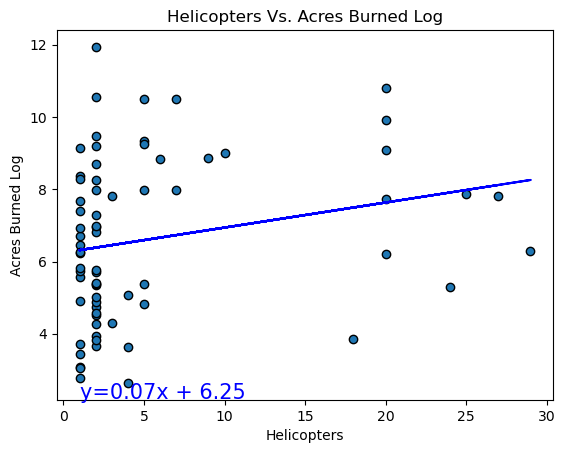

In [86]:
Helicopters= df_FG[df_FG['Helicopters'] != 0]
x=Helicopters['Helicopters']

y=Helicopters['Acres Burned Log'] 
 
linear_regression_plot(x,y) 

plt.xlabel('Helicopters')
plt.ylabel('Acres Burned Log')
plt.title('Helicopters Vs. Acres Burned Log')
plt.scatter(x,y, marker='o', edgecolors='black')
plt.savefig('Output_Data/Helicopters Vs. Acres Burned Log_FG.png')
plt.show()

# Correlation Between Water Tenders and Acres Burned

The r^2 value is: 0.1239992095503835


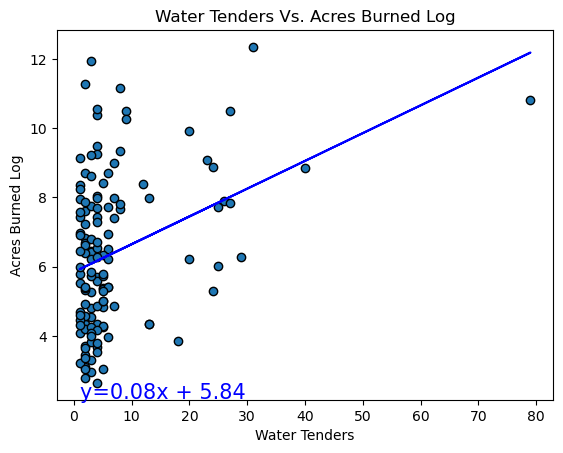

In [88]:
Helicopters= df_FG[df_FG['Water Tenders'] != 0]
x=Helicopters['Water Tenders']

y=Helicopters['Acres Burned Log'] 
 
linear_regression_plot(x,y) 

plt.xlabel('Water Tenders')
plt.ylabel('Acres Burned Log')
plt.title('Water Tenders Vs. Acres Burned Log')
plt.scatter(x,y, marker='o', edgecolors='black')
plt.savefig('Output_Data/Water Tenders Vs. Acres Burned Log_FG.png')
plt.show()

# How the Wildfires affect the Air Quality.

In [90]:
df_ES= df.copy()

In [91]:
df_value_counts= df_ES["County"].value_counts()
print(df_value_counts.head(10))

County
Riverside          288
San Diego          155
Kern               145
Fresno             120
Los Angeles        110
San Luis Obispo    104
San Bernardino     103
Butte               94
Shasta              91
Siskiyou            87
Name: count, dtype: int64


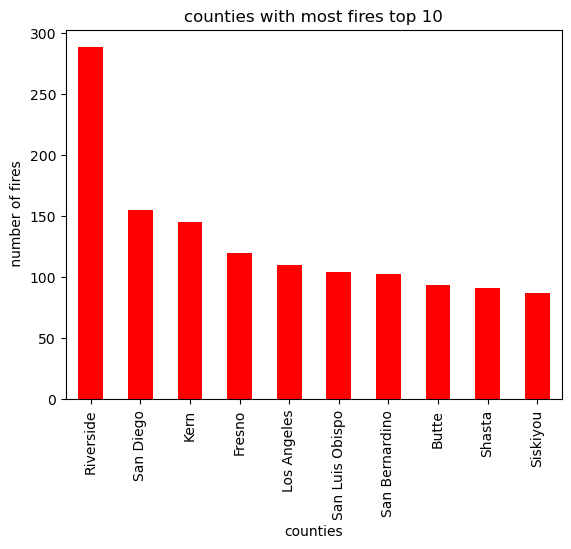

In [92]:
df_value_counts.head(10).plot(kind="bar",color = "red")
plt.title("counties with most fires top 10")
plt.xlabel("counties")
plt.ylabel(" number of fires")
plt.savefig("Output_Data/counties with most fires top 10_ES")
plt.show()

In [93]:
county_acres_burned = df_ES.groupby("County")["Acres Burned"].sum()
county_acres_burned.sort_values(ascending=False).head(10)

County
Mendocino, Humboldt, Trinity, Tehama, Glenn, Lake, Colusa      1032648.0
Butte, Plumas, Shasta, Lassen, Tehama                           963309.0
Siskiyou                                                        722117.0
Butte, Tehama                                                   429603.0
Colusa, Mendocino, Glenn, Lake                                  410203.0
Santa Clara, San Joaquin, Contra Costa, Alameda, Stanislaus     396624.0
Fresno, Madera                                                  379895.0
Napa, Solano, Lake, Sonoma, Yolo                                363220.0
Tuolumne                                                        312682.0
Fresno                                                          305938.0
Name: Acres Burned, dtype: float64

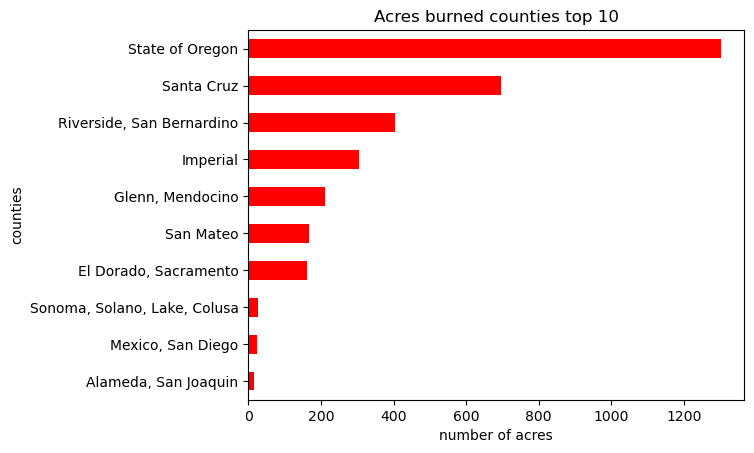

In [94]:
county_acres_burned.sort_values().head(10).plot(kind="barh",color = "red")
plt.title("Acres burned counties top 10")
plt.ylabel("counties")
plt.xlabel("number of acres")
plt.savefig("Output_Data/Acres burned counties top 10_ES")
plt.show()

In [95]:
df_ES["Fire Started"] = pd.to_datetime(df_ES["Fire Started"], errors='coerce')
df_ES["Fire Extinguished"] = pd.to_datetime(df_ES["Fire Extinguished"], errors='coerce')

df_ES = df_ES.dropna(subset=["Fire Started", "Fire Extinguished"])

df_ES["fire duration"] =df_ES["Fire Extinguished"] - df_ES["Fire Started"]

max_duration = df_ES["fire duration"].max()
longest_fires = df_ES[df_ES["fire duration"] == max_duration]

print(longest_fires)

      Unnamed: 0  Incident Name    County     Administrative Unit  \
1953        1953  Washburn Fire  Mariposa  Yosemite National Park   

      Acres Burned  Crews Involved  Dozers  Engines  Fatalities  Helicopters  \
1953        4886.0             0.0     0.0      0.0         0.0          0.0   

      ...  Structures Damaged  Structures Destroyed  Structures Threatened  \
1953  ...                 0.0                   0.0                    0.0   

      Water Tenders              Fire Started         Fire Extinguished  \
1953            0.0 2022-07-07 14:13:08+00:00 2023-08-03 09:29:42+00:00   

     Longitude Latitude                           Incident ID  \
1953  -119.614   37.499  776de6ba-3e3c-4388-b257-44e8c9231a95   

         fire duration  
1953 391 days 19:16:34  

[1 rows x 22 columns]


In [96]:
fire_format=longest_fires[["County","Fire Started", "Fire Extinguished", "fire duration"]]
print(fire_format)

        County              Fire Started         Fire Extinguished  \
1953  Mariposa 2022-07-07 14:13:08+00:00 2023-08-03 09:29:42+00:00   

         fire duration  
1953 391 days 19:16:34  


In [97]:
airquality_es = pd.read_csv("./Data source/California_airquality.csv")
airquality_es.head()

,Date,Source,Site ID,POC,Daily Mean PM2.5 Concentration,UNITS,DAILY_AQI_VALUE,Site Name,DAILY_OBS_COUNT,PERCENT_COMPLETE,AQS_PARAMETER_CODE,AQS_PARAMETER_DESC,CBSA_CODE,CBSA_NAME,STATE_CODE,STATE,COUNTY_CODE,COUNTY,SITE_LATITUDE,SITE_LONGITUDE
0,1/1/20,AQS,60010007,3,8.6,ug/m3 LC,36,Livermore,1,100,88101,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217
1,1/2/20,AQS,60010007,3,4.5,ug/m3 LC,19,Livermore,1,100,88101,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217
2,1/3/20,AQS,60010007,3,14.2,ug/m3 LC,55,Livermore,1,100,88101,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217
3,1/4/20,AQS,60010007,3,10.9,ug/m3 LC,45,Livermore,1,100,88101,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217
4,1/5/20,AQS,60010007,3,7.8,ug/m3 LC,33,Livermore,1,100,88101,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217


In [98]:
airquality_es.dtypes

Date                               object
Source                             object
Site ID                             int64
POC                                 int64
Daily Mean PM2.5 Concentration    float64
UNITS                              object
DAILY_AQI_VALUE                     int64
Site Name                          object
DAILY_OBS_COUNT                     int64
PERCENT_COMPLETE                    int64
AQS_PARAMETER_CODE                  int64
AQS_PARAMETER_DESC                 object
CBSA_CODE                         float64
CBSA_NAME                          object
STATE_CODE                          int64
STATE                              object
COUNTY_CODE                         int64
COUNTY                             object
SITE_LATITUDE                     float64
SITE_LONGITUDE                    float64
dtype: object

In [99]:
airquality_es["Date"] = pd.to_datetime(airquality_es["Date"])

C:\Users\dagim\AppData\Local\Temp\ipykernel_15992\2771608916.py:1: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [100]:
airquality_es.columns

Index(['Date', 'Source', 'Site ID', 'POC', 'Daily Mean PM2.5 Concentration',
       'UNITS', 'DAILY_AQI_VALUE', 'Site Name', 'DAILY_OBS_COUNT',
       'PERCENT_COMPLETE', 'AQS_PARAMETER_CODE', 'AQS_PARAMETER_DESC',
       'CBSA_CODE', 'CBSA_NAME', 'STATE_CODE', 'STATE', 'COUNTY_CODE',
       'COUNTY', 'SITE_LATITUDE', 'SITE_LONGITUDE'],
      dtype='object')

In [101]:
airquality_es[airquality_es["Daily Mean PM2.5 Concentration"] > 50].columns

Index(['Date', 'Source', 'Site ID', 'POC', 'Daily Mean PM2.5 Concentration',
       'UNITS', 'DAILY_AQI_VALUE', 'Site Name', 'DAILY_OBS_COUNT',
       'PERCENT_COMPLETE', 'AQS_PARAMETER_CODE', 'AQS_PARAMETER_DESC',
       'CBSA_CODE', 'CBSA_NAME', 'STATE_CODE', 'STATE', 'COUNTY_CODE',
       'COUNTY', 'SITE_LATITUDE', 'SITE_LONGITUDE'],
      dtype='object')

In [102]:
# airquality_es.columns = airquality_es.columns.str.strip()

high_pm25 = airquality_es[airquality_es["Daily Mean PM2.5 Concentration"] > 50]

if "COUNTY" in high_pm25.columns:
    counties = high_pm25["COUNTY"].unique()
    print("Counties with Daily Mean PM2.5 Concentration over 50:", counties)


Counties with Daily Mean PM2.5 Concentration over 50: ['Alameda' 'Butte' 'Calaveras' 'Colusa' 'Contra Costa' 'Fresno' 'Glenn'
 'Inyo' 'Kern' 'Kings' 'Los Angeles' 'Madera' 'Marin' 'Mariposa' 'Merced'
 'Mono' 'Monterey' 'Napa' 'Nevada' 'Orange' 'Placer' 'Plumas' 'Sacramento'
 'San Benito' 'San Bernardino' 'San Francisco' 'San Joaquin'
 'San Luis Obispo' 'San Mateo' 'Santa Barbara' 'Santa Clara' 'Santa Cruz'
 'Siskiyou' 'Solano' 'Sonoma' 'Stanislaus' 'Sutter' 'Tulare' 'Yolo']


In [103]:
airquality_es.groupby("Date")[["COUNTY","Daily Mean PM2.5 Concentration"]].max().head()

,COUNTY,Daily Mean PM2.5 Concentration
Date,,
2020-01-01,Yolo,47.3
2020-01-02,Yolo,35.9
2020-01-03,Yolo,33.8
2020-01-04,Yolo,36.8
2020-01-05,Yolo,45.9


In [104]:
df_ES["Fire Started 2"] = df_ES["Fire Started"].dt.date

In [105]:
merged_df = pd.merge(df_ES.set_index("Fire Started 2"), airquality_es.set_index("Date"), left_on = "County", right_on = "COUNTY", how = "left")
merged_df.head()

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,AQS_PARAMETER_CODE,AQS_PARAMETER_DESC,CBSA_CODE,CBSA_NAME,STATE_CODE,STATE,COUNTY_CODE,COUNTY,SITE_LATITUDE,SITE_LONGITUDE
0,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,88502.0,Acceptable PM2.5 AQI & Speciation Mass,13860.0,"Bishop, CA",6.0,California,27.0,Inyo,37.360684,-118.330783
1,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,88101.0,PM2.5 - Local Conditions,13860.0,"Bishop, CA",6.0,California,27.0,Inyo,37.360684,-118.330783
2,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,88101.0,PM2.5 - Local Conditions,13860.0,"Bishop, CA",6.0,California,27.0,Inyo,37.360684,-118.330783
3,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,88502.0,Acceptable PM2.5 AQI & Speciation Mass,13860.0,"Bishop, CA",6.0,California,27.0,Inyo,37.360684,-118.330783
4,0,River Fire,Inyo,CAL FIRE San Bernardino Unit,407.0,25.0,25.0,25.0,0.0,0.0,...,88101.0,PM2.5 - Local Conditions,13860.0,"Bishop, CA",6.0,California,27.0,Inyo,37.360684,-118.330783


In [106]:
merged_df[["Longitude","SITE_LONGITUDE", "Latitude","SITE_LATITUDE"]].head(5)

,Longitude,SITE_LONGITUDE,Latitude,SITE_LATITUDE
0,-118.01651,-118.330783,36.602575,37.360684
1,-118.01651,-118.330783,36.602575,37.360684
2,-118.01651,-118.330783,36.602575,37.360684
3,-118.01651,-118.330783,36.602575,37.360684
4,-118.01651,-118.330783,36.602575,37.360684


In [107]:
bins = [0, 50, 100, 150, 200, 300, 1000]
labels= ["Green", "Yellow", "Orange", "Red", "Purple", "Maroon"]
airquality_es["AQI_Color"]= pd.cut(airquality_es["DAILY_AQI_VALUE"], bins= bins, labels= labels)

In [108]:
airquality_es.head(3)

,Date,Source,Site ID,POC,Daily Mean PM2.5 Concentration,UNITS,DAILY_AQI_VALUE,Site Name,DAILY_OBS_COUNT,PERCENT_COMPLETE,...,AQS_PARAMETER_DESC,CBSA_CODE,CBSA_NAME,STATE_CODE,STATE,COUNTY_CODE,COUNTY,SITE_LATITUDE,SITE_LONGITUDE,AQI_Color
0,2020-01-01,AQS,60010007,3,8.6,ug/m3 LC,36,Livermore,1,100,...,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217,Green
1,2020-01-02,AQS,60010007,3,4.5,ug/m3 LC,19,Livermore,1,100,...,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217,Green
2,2020-01-03,AQS,60010007,3,14.2,ug/m3 LC,55,Livermore,1,100,...,PM2.5 - Local Conditions,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217,Yellow


In [109]:
bins = [0, 50, 100, 150, 200, 300, 1000]
labels= ["Good", "Moderate", "Unheathy For Sensitive Groups", "Unhelthy For All", "Vert Unhealthy", "Hazardous"]
airquality_es["AQI_Category"]= pd.cut(airquality_es["DAILY_AQI_VALUE"], bins= bins, labels= labels)
airquality_es.head(3)

,Date,Source,Site ID,POC,Daily Mean PM2.5 Concentration,UNITS,DAILY_AQI_VALUE,Site Name,DAILY_OBS_COUNT,PERCENT_COMPLETE,...,CBSA_CODE,CBSA_NAME,STATE_CODE,STATE,COUNTY_CODE,COUNTY,SITE_LATITUDE,SITE_LONGITUDE,AQI_Color,AQI_Category
0,2020-01-01,AQS,60010007,3,8.6,ug/m3 LC,36,Livermore,1,100,...,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217,Green,Good
1,2020-01-02,AQS,60010007,3,4.5,ug/m3 LC,19,Livermore,1,100,...,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217,Green,Good
2,2020-01-03,AQS,60010007,3,14.2,ug/m3 LC,55,Livermore,1,100,...,41860.0,"San Francisco-Oakland-Hayward, CA",6,California,1,Alameda,37.687526,-121.784217,Yellow,Moderate


In [110]:
load_dotenv()

map_box_api = os.getenv("MAPBOX_API_KEY")  
px.set_mapbox_access_token(map_box_api)

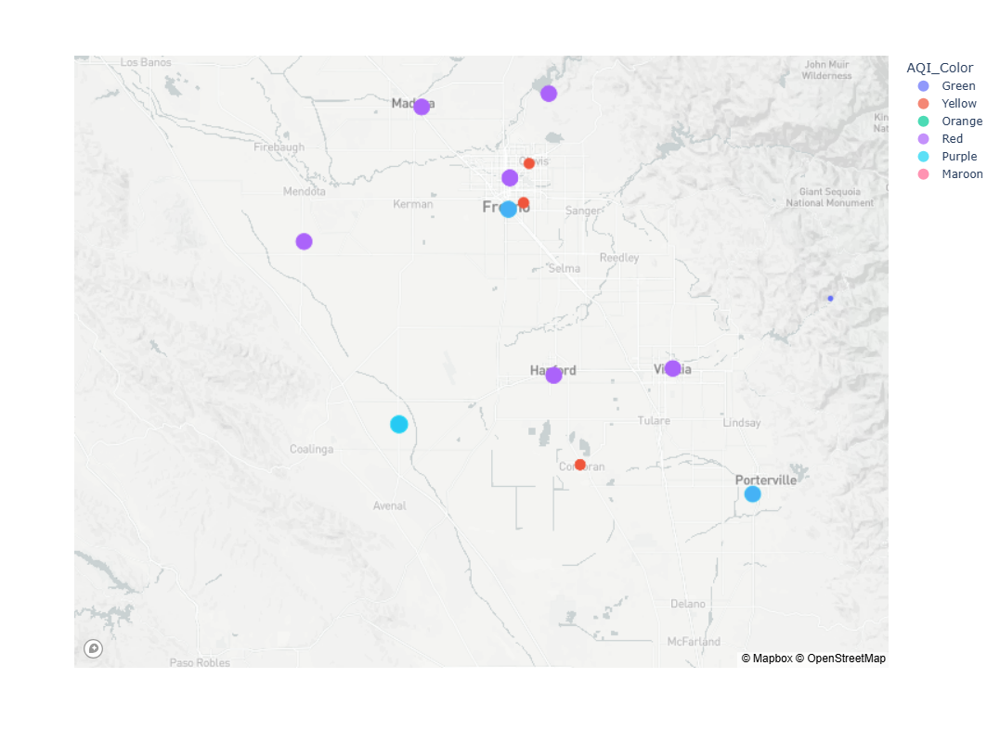

In [289]:
map_1 = px.scatter_mapbox(airquality_es,
    lat="SITE_LATITUDE",
    lon="SITE_LONGITUDE", 
    color="AQI_Color",
    size= "DAILY_AQI_VALUE",                      
    width=1000,
    height=800,                      
                          
)
map_1.show()

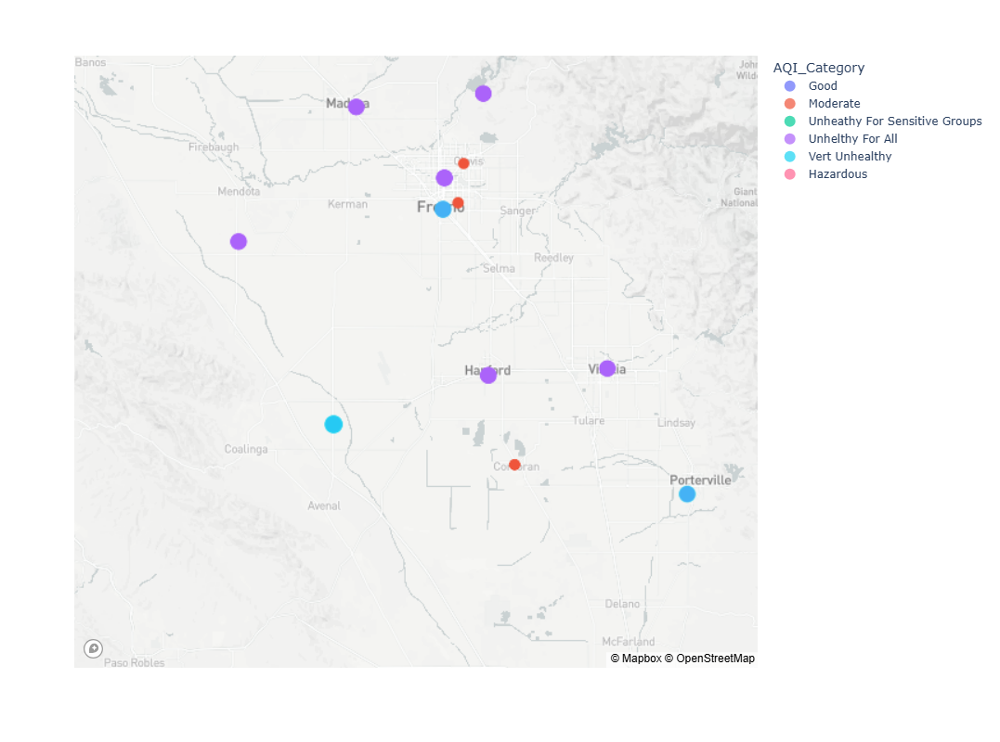

In [291]:
map_1 = px.scatter_mapbox(airquality_es,
    lat="SITE_LATITUDE",
    lon="SITE_LONGITUDE", 
    color="AQI_Category",
    size= "DAILY_AQI_VALUE",                      
    width=1000,
    height=800,                      
                          
)
map_1.show()

# Wildfire Size Classification

In [114]:
#make a copy of the original dataset
df_sg = df.copy()
df_sg= df_sg[['Incident Name','County','Acres Burned','Fire Started','Fire Extinguished']]
df_sg.head(3)

,Incident Name,County,Acres Burned,Fire Started,Fire Extinguished
0,River Fire,Inyo,407.0,2013-02-24T08:16:00Z,2013-02-28T20:00:00Z
1,Fawnskin Fire,San Bernardino,30.0,2013-04-20T17:30:00Z,2013-04-22T09:00:00Z
2,Gold Fire,Madera,274.0,2013-04-30T12:59:00Z,2013-05-01T07:00:00Z


In [115]:
#Catagorize the acres burned into small, medium and Large wildfire
bins = [0, 1000, 50000, df_sg['Acres Burned'].max()]
labels = ['Small', 'Medium', 'Large']
df_sg['Acres Burnned Size'] = pd.cut(df_sg['Acres Burned'], labels=labels, bins= bins)
df_sg.sample(3)


,Incident Name,County,Acres Burned,Fire Started,Fire Extinguished,Acres Burnned Size
686,Clear Complex (merged into Eclipse Complex),Siskiyou,0.0,2017-07-25T12:45:00Z,2018-01-09T12:05:00Z,NaN
85,Falls Fire,Riverside,1383.0,2013-08-05T10:10:00Z,2013-08-09T18:45:00Z,Medium
2044,Harney Fire,Tuolumne,37.0,2023-06-21T17:30:00Z,2023-06-23T18:25:28Z,Small


In [116]:
df_sg['Year Started'] = pd.to_datetime(df_sg['Fire Started']).dt.year
df_sg = df_sg[df_sg['Year Started'] != 2025 ]

acres_size_agg= df_sg.groupby('Acres Burnned Size',observed=False)['Acres Burned'].agg(['mean', 'median', 'max','min', 'std'])
acres_size_agg

,mean,median,max,min,std
Acres Burnned Size,,,,,
Small,136.623965,61.0,1000.0,2.0,183.534249
Medium,8166.408269,3674.0,48920.0,1010.0,10704.944797
Large,181571.630435,96004.0,1032648.0,50198.0,205664.810618


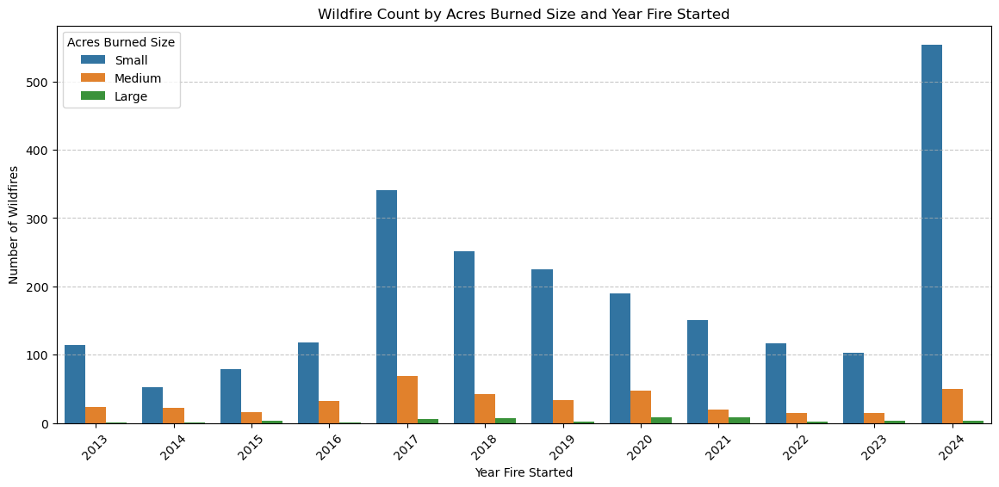

In [117]:
grouped_df= df_sg.groupby(['Year Started', 'Acres Burnned Size'],observed=False)['Acres Burnned Size'].size().reset_index(name='Count')

plt.figure(figsize=(14, 6))
sns.barplot(data=grouped_df, x='Year Started', y='Count', hue='Acres Burnned Size')
plt.xlabel('Year Fire Started')
plt.ylabel('Number of Wildfires')
plt.title('Wildfire Count by Acres Burned Size and Year Fire Started')
plt.legend(title='Acres Burned Size')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig("Output_Data/Wildfire Count by Acres Burned Size and Year Fire Started_SG.png")
plt.show()

# Does the number of First Responders have a correlation with the number of acres burned?

In [119]:
df["County"].value_counts().head(10)

County
Riverside          288
San Diego          155
Kern               145
Fresno             120
Los Angeles        110
San Luis Obispo    104
San Bernardino     103
Butte               94
Shasta              91
Siskiyou            87
Name: count, dtype: int64

In [120]:
Freq_Counties_DF = df[(df['County'] == 'Riverside') | (df['County'] == 'Kern') | (df['County'] == 'San Diego') |
                (df['County'] == 'Fresno') | (df['County'] == 'Los Angeles') | (df['County'] == 'San Bernardino') | 
                (df['County'] == 'Siskiyou') | (df['County'] == 'Shasta') | (df['County'] == 'Butte')  | 
                (df['County'] == 'San Luis Obispo')]
Freq_Counties_DF.head()

,Unnamed: 0,Incident Name,County,Administrative Unit,Acres Burned,Crews Involved,Dozers,Engines,Fatalities,Helicopters,...,Personnel Involved,Structures Damaged,Structures Destroyed,Structures Threatened,Water Tenders,Fire Started,Fire Extinguished,Longitude,Latitude,Incident ID
1,1,Fawnskin Fire,San Bernardino,San Bernardino National Forest,30.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-04-20T17:30:00Z,2013-04-22T09:00:00Z,-116.941311,34.288877,58f89ff8-bd3e-4355-b1c0-8fa05c747d3f
6,6,Summit Fire,Riverside,CAL FIRE/Riverside County Fire,2956.0,36.0,5.0,62.0,0.0,5.0,...,726.0,0.0,1.0,0.0,7.0,2013-05-01T12:38:00Z,2013-05-04T18:30:00Z,-116.941311,34.288877,a1b14be5-a8cf-4e40-8588-96becf4c5879
9,9,Gorgonio Fire,Riverside,CAL FIRE/Riverside County Fire,650.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2013-05-04T11:43:00Z,2013-05-05T18:45:00Z,-116.855019,33.894055,958ce6d2-97f9-4848-8620-d14ab87f329d
10,10,Lytle Fire,San Bernardino,"USFS San Bernardino National Forest, CAL FIRE ...",75.0,13.0,0.0,21.0,0.0,0.0,...,292.0,0.0,1.0,0.0,13.0,2013-05-13T13:30:00Z,2013-05-15T08:15:00Z,-117.440800,34.183400,e2c4b308-9a2d-483b-8434-999bef9adc7c
12,12,54 Fire,Riverside,CAL FIRE Riverside Unit,40.0,0.0,1.0,19.0,0.0,0.0,...,65.0,0.0,0.0,0.0,0.0,2013-05-16T13:48:00Z,2013-05-17T08:30:00Z,-116.161201,33.655638,e215290f-d0b4-48fd-be32-f599959347b1


In [121]:
County_Sum = Freq_Counties_DF.groupby(['County'])['Acres Burned'].sum()
County_Sum

County
Butte              268023.0
Fresno             305938.0
Kern               245168.0
Los Angeles        199566.0
Riverside          191157.0
San Bernardino     240061.0
San Diego           94291.0
San Luis Obispo    110371.0
Shasta             185095.0
Siskiyou           722117.0
Name: Acres Burned, dtype: float64

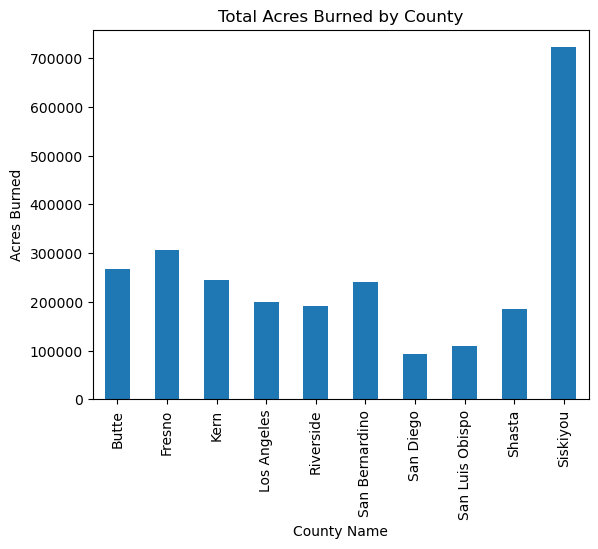

In [122]:
panda_plot = County_Sum.plot.bar()
panda_plot.set_xlabel("County Name")
panda_plot.set_ylabel("Acres Burned")
panda_plot.set_title("Total Acres Burned by County")

plt.savefig("Output_Data/Acres Burned by County_PC.png")

In [123]:
County_Ppl = Freq_Counties_DF.groupby(['County'])['Personnel Involved'].sum()
County_Ppl

County
Butte              5135.0
Fresno             1534.0
Kern                502.0
Los Angeles        1367.0
Riverside          3874.0
San Bernardino     3246.0
San Diego          7278.0
San Luis Obispo    1958.0
Shasta             2312.0
Siskiyou           1367.0
Name: Personnel Involved, dtype: float64

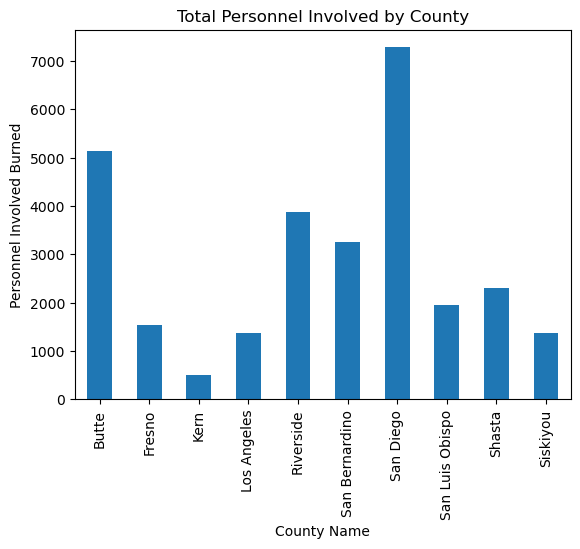

In [124]:
panda_plot = County_Ppl.plot.bar()
panda_plot.set_xlabel("County Name")
panda_plot.set_ylabel("Personnel Involved Burned")
panda_plot.set_title("Total Personnel Involved by County")

plt.savefig("Output_Data/Total Personnel Involved by County_PC.png")

In [125]:
def linear_regression_plot(x,y):
    slope, intercept, r, p, std_err = linregress(x,y)
    
    y_axis = list(map((lambda x_valus: slope * x_valus + intercept), x))

    plt.plot(x, y_axis, color= 'blue')

    equation = f"y={slope:.2f}x + {intercept:.2f}"
    plt.text(min(x),min(y), equation, fontsize= 15, color='blue', verticalalignment='top')

    print(f'The r^2 value is: {np.square(r)}')

The r^2 value is: 0.2746289159818175


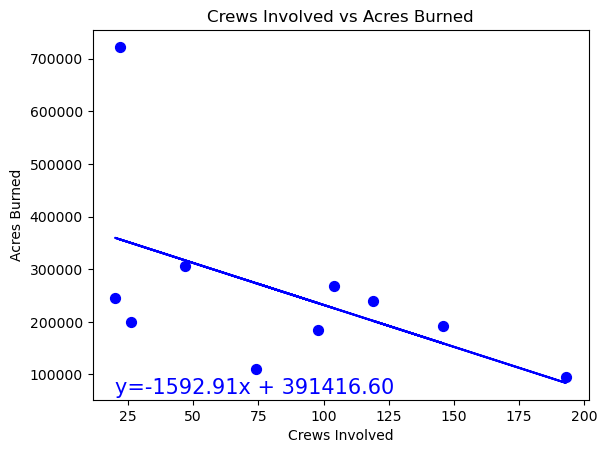

<Figure size 640x480 with 0 Axes>

In [126]:
x = Freq_Counties_DF.groupby(['County'])['Crews Involved'].sum()
y = Freq_Counties_DF.groupby(['County'])['Acres Burned'].sum()


plt.scatter(x, y, color='blue', marker='o', s=50)

linear_regression_plot(x, y)
plt.xlabel("Crews Involved")
plt.ylabel("Acres Burned")
plt.title("Crews Involved vs Acres Burned")
plt.show()

plt.savefig("Output_Data/Crews Involved vs Acres Burned_PC.png")

# Is there a significant difference in the average acres burned between counties?

In [128]:
#Describe Acres Burned data
pd.options.display.float_format = '{:.2f}'.format
df['Acres Burned'].describe()

count      2779.00
mean       4276.28
std       35190.50
min           0.00
25%          30.00
50%          83.00
75%         348.00
max     1032648.00
Name: Acres Burned, dtype: float64

 - Mean (4,276 acres) is much higher than the median (83 acres)
 - Right-skewed distribution (few massive wildfires).
 - High standard devation indicating high varaiability
 - 75% of fires burn <= 348 acres
 - 25% of fires burned <= 30 acres - most fires are small

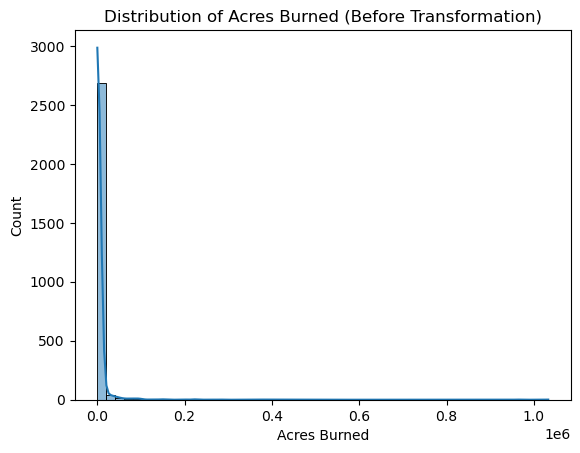

In [130]:
#Plot the Acres Burned distribution before transformation
sns.histplot(df['Acres Burned'], bins=50, kde=True)
plt.title("Distribution of Acres Burned (Before Transformation)")
plt.xlabel("Acres Burned")
plt.show()

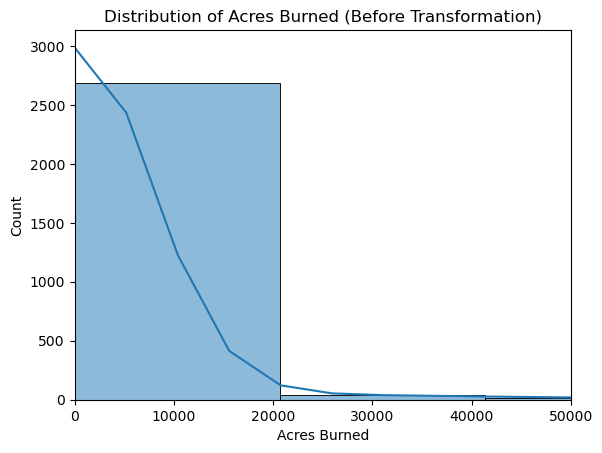

In [131]:
##Plot the Acres Burned distribution before transformation with x-axis limit of 50,000
sns.histplot(df['Acres Burned'], bins=50, kde=True)
plt.xlim(0, 50000)
plt.title("Distribution of Acres Burned (Before Transformation)")
plt.xlabel("Acres Burned")
plt.show()

In [132]:
#make a copy and Add a new column with a Log Trasformation of Acres burned
df_dg = df.copy()
df_dg['Acres Burned Log'] = np.log1p(df_dg['Acres Burned'])

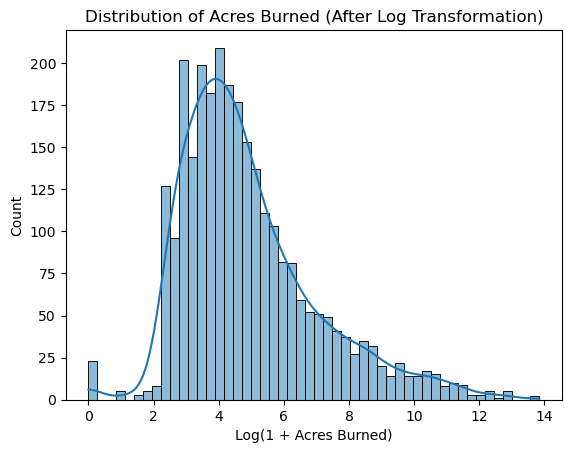

In [133]:
#Plot the Acres Burned distribution after transformation
sns.histplot(df_dg['Acres Burned Log'], bins=50, kde=True)
plt.title("Distribution of Acres Burned (After Log Transformation)")
plt.xlabel("Log(1 + Acres Burned)")
plt.savefig("Output_Data/Distribution of Acres Burned (After Log Transformation)_DG.png")
plt.show()

# Hypothesis 
 - **Null Hypothesis:** Thers is no signifficant difference in the average acres burned between counties
 - **Alternative Hypothesis:** There is a significant difference in the average acres burned between counties.

In [135]:
#filter and keep only Acres Burned greater than 100 acres
df_dg =df_dg[df_dg['Acres Burned']> 100]

In [136]:
#Create an idex with top 10 counties
top_counties = df_dg['County'].value_counts().head(10).index
top_counties

Index(['Kern', 'Riverside', 'Los Angeles', 'San Diego', 'Fresno',
       'San Luis Obispo', 'Siskiyou', 'San Bernardino', 'Tulare', 'Butte'],
      dtype='object', name='County')

In [137]:
#keep only the top 10 counties
df_dg = df_dg[df_dg['County'].isin(top_counties)]

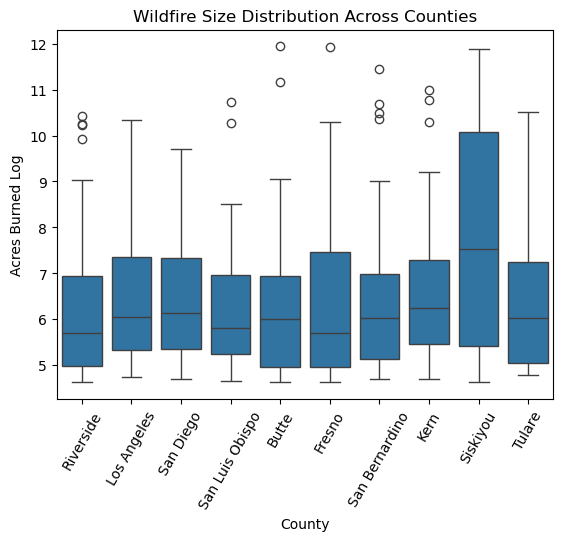

In [138]:
#Boxplot the top ten counties
sns.boxplot(x='County', y='Acres Burned Log', data= df_dg)
plt.xticks(rotation = 60)
plt.title("Wildfire Size Distribution Across Counties")
plt.savefig("Output_Data/Wildfire Size Distribution Across Counties_DG.png")
plt.show()

In [139]:
#Describe the top ten counties
df_dg.groupby('County')['Acres Burned Log'].describe()

,count,mean,std,min,25%,50%,75%,max
County,,,,,,,,
Butte,37.00,6.42,1.78,4.64,4.97,6.00,6.95,11.94
Fresno,56.00,6.40,1.82,4.63,4.96,5.69,7.47,11.93
Kern,93.00,6.53,1.35,4.71,5.46,6.25,7.30,10.99
Los Angeles,67.00,6.57,1.56,4.74,5.33,6.05,7.35,10.34
Riverside,86.00,6.16,1.46,4.62,4.99,5.71,6.95,10.42
San Bernardino,43.00,6.45,1.73,4.71,5.14,6.03,6.99,11.44
San Diego,58.00,6.44,1.28,4.71,5.35,6.13,7.33,9.70
San Luis Obispo,46.00,6.24,1.37,4.66,5.24,5.82,6.97,10.74
Siskiyou,43.00,7.72,2.35,4.62,5.42,7.54,10.08,11.89


# Statistical Testing
- To compare means across multiple groups, we will use Anova statistical testing method
- First we will check the variances across the groups using Leven's test to decide which if One-way ANOVA is appropriate
    - If p-value is >= 0.05 groups have equal variance and One-way ANOVA is appropriate
    - If P-value is < 0.05 groups have unequal variance and Welch's Anova is appropriate

## Levene’s Test

In [142]:
counties = df_dg['County'].unique()

groups =[df_dg[df_dg['County']== county]['Acres Burned Log'] for county in counties]


stat, P_value = stats.levene(*groups)

print(f"Levene's Test: {stat}, P-value: {P_value} ")

Levene's Test: 4.002920441751386, P-value: 5.662284548570341e-05 


- Since p-value < 0.05, meaning the variances across counties are significantly different and a standard ANOVA is not appropriate because it assumes equal variances which is not true for our data. 

## Welch's ANOVA 

In [145]:
anova = pg.welch_anova(dv='Acres Burned Log', between='County', data=df_dg)
print(anova)

   Source  ddof1  ddof2    F  p-unc  np2
0  County      9 198.10 1.94   0.05 0.05


- since p-value(p-unc) = 0.05, right on the borderline and it **suggests weak evidence** that at least one county has significantly different acres
  burned mean 
- The effect size (np2) suggests a small effect size, meaning the difference betweeen counties is not very large

## Post-hoc Analysis

In [148]:
posthoc = pg.pairwise_gameshowell(dv='Acres Burned Log', between='County', data=df_dg)
significant_results = posthoc[posthoc['pval'] < 0.05]
significant_results

,A,B,mean(A),mean(B),diff,se,T,df,pval,hedges
33,Riverside,Siskiyou,6.16,7.72,-1.56,0.39,-3.99,58.81,0.01,-0.86
42,San Luis Obispo,Siskiyou,6.24,7.72,-1.49,0.41,-3.62,66.72,0.02,-0.77


- This are the counties with a significant difference in acres burned, since p-value is less than 0.05
- Siskiyou stand out as having a significantly different average acres burned compared to the other counties involved in the comparisons

In [150]:
import warnings
warnings.filterwarnings("ignore")
plt_county = df_dg.groupby('County').apply(lambda x: x.sample(n=1)).reset_index(drop=True)

In [151]:
plt_county.hvplot.points('Longitude', 'Latitude',
                geo = True,
                color='County',
                size=10*20,         
                alpha=0.8,
                frame_width= 900,
                 frame_height = 500,
                tiles='OSM'
)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (County)

In [152]:
#The total acres burned in each county in descending order
df_dg.groupby('County')['Acres Burned'].sum().sort_values(ascending=False)

County
Siskiyou          720696.00
Fresno            303598.00
Butte             265835.00
Kern              242579.00
San Bernardino    237249.00
Los Angeles       197957.00
Riverside         184273.00
Tulare            107909.00
San Luis Obispo   107823.00
San Diego          90328.00
Name: Acres Burned, dtype: float64

# Hypothesis Testing Without Siskiyou County 

In [154]:
#Remove Siskiyou county
df_dg = df_dg[df_dg['County'] != 'Siskiyou']

In [155]:
df_dg['County'].unique()

array(['Riverside', 'Los Angeles', 'San Diego', 'San Luis Obispo',
       'Butte', 'Fresno', 'San Bernardino', 'Kern', 'Tulare'],
      dtype=object)

## Welch's ANOVA 

In [157]:
anova = pg.welch_anova(dv='Acres Burned Log', between='County', data=df_dg)
print(anova)

   Source  ddof1  ddof2    F  p-unc  np2
0  County      8 186.06 0.59   0.79 0.01


- After removing Siskiyou county we did the same Welch's Anova test and the P-value now is 0.79(very high). This means there is no significant
  difference in average acres burned between the remaining 9 counties.
- The Effec size(nps) is 0.01, very small and this suggests that county differences explain almost none(1%) of the variance in acres burned.

### Fail to reject the null hypothesis:
  - After removing Siskiyou County, there is no statistical evidence that wildfire acres burned differs between the remaining 9 counties.
  - Previous significance was driven by Siskiyou County. This confirms that Siskiyou was the main driver of differences in the original test.
  - without Siskiyou, county does not seem to affect acres burned significantly.

# Why does Siskiyou County experience the largest area of wildfires compared to other counties?

 California has had decades of fire suppression and climate change which drastically incresed the wildfire size and intesnity throughout the state.
- 2020 fire season being a record breaking season
- 5 of the 6 California largest fires burned at the same time
- Over 4 million acres burned across the the state

### Siskiyou County is prone to wildfires due to the combination of the following factors:

- Human caused climate change: Incresed the likelihood and intensity of hot, dry and windy conditions
- Siskiyou county has  Fire Exclusion policies, which are land management practices where all fires, regardless of cause are actively suppresed and prevented from occurring in a specific area.
    - Fire exclusion policies are often used in forestry to protect against potential damange against wildfires
    - This does have some negative ecological consequences by allowing excessive fuel buildup over time
- Geologically, it is the northern most county in California, on the boarder of Oregon
- Has more wildlife and forestry; Can be a wetter climate due to rain
- 5th largest county in California
- 60% of the land in Siskiyou county is managed by Federal and State government agencies
- Large portions of Siskiyou co lies on volcanic land.